<a href="https://colab.research.google.com/github/Arabasma/ML-and-NLP-Projects/blob/main/Comparaison_AppSup_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset Classic4


## Importation du dataset

In [ ]:
import pandas as pd
import numpy as np
import warnings

In [ ]:
#classic4
url='https://drive.google.com/file/d/1fMeNQm4fF1NpgTe2WVO3kQP16p_N6fYw/view'
url2='https://drive.google.com/uc?id=' + url.split('/')[-2]
classic4 = pd.read_csv(url2)

texts = classic4['text'].values
labels = classic4['label'].values
k=4

In [ ]:
len(texts)

7095

## Representation textuelle

### Word2vec

In [ ]:
! wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz" #Word2vec

--2021-12-05 09:55:11--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.84.22
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.84.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: ‘GoogleNews-vectors-negative300.bin.gz’

GoogleNews-vectors- 100%[===================>]   1.53G  45.8MB/s    in 35s     

2021-12-05 09:55:46 (45.1 MB/s) - ‘GoogleNews-vectors-negative300.bin.gz’ saved [1647046227/1647046227]



In [ ]:
def tokenize_re(text, min_len=2):
    tokens = token_pattern.findall(text)
    return [x for x in tokens if len(x) >= min_len]

In [ ]:
import re
token_pattern = r"(?u)\b\w\w+\b"
token_pattern = re.compile(token_pattern)

In [ ]:
def static_document_embeddings(word_embedding_func, docs, tokenizer, n_dims=300):
    """
        Given a set of tokenized sentences, compute the mean vector of w2v vectors for each sentence
    """
    doc_vectors = []
    for doc in docs:
        doc = tokenizer(doc)
        word_vectors = []
        for word in doc:
            vector = word_embedding_func(word)
            if vector is not None:
                word_vectors.append(vector)
        if word_vectors:
            doc_vector = np.array(word_vectors).mean(axis=0)
        else:
            warnings.warn("Zeros returned. Words not in vocabulary \"{}\"".format(doc), Warning)
            doc_vector = np.array([0] * n_dims)

        doc_vectors.append(doc_vector)
    return np.array(doc_vectors)

In [ ]:
from gensim.models import KeyedVectors

w2v_model= KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin.gz", binary=True)

In [ ]:
get_w2v_vector=lambda x: w2v_model[x] if x in w2v_model.vocab else None

In [ ]:
X_w2v= static_document_embeddings(get_w2v_vector, texts, tokenize_re)
X_w2v.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: Warning: Zeros returned. Words not in vocabulary "['Neliac']"
  app.launch_new_instance()


(7095, 300)

In [ ]:
del w2v_model

### GloVe1

In [ ]:
! wget -c "https://nlp.stanford.edu/data/glove.840B.300d.zip"

--2021-12-05 09:58:37--  https://nlp.stanford.edu/data/glove.840B.300d.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.840B.300d.zip [following]
--2021-12-05 09:58:37--  http://downloads.cs.stanford.edu/nlp/data/glove.840B.300d.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2176768927 (2.0G) [application/zip]
Saving to: ‘glove.840B.300d.zip’

glove.840B.300d.zip 100%[===================>]   2.03G  5.20MB/s    in 6m 50s  

2021-12-05 10:05:27 (5.06 MB/s) - ‘glove.840B.300d.zip’ saved [2176768927/2176768927]



In [ ]:
! unzip glove.840B.300d.zip

Archive:  glove.840B.300d.zip
  inflating: glove.840B.300d.txt     


In [ ]:
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

In [ ]:
glove_file = './glove.840B.300d.txt'
tmp_file = get_tmpfile("test_word2vec.txt")

_ = glove2word2vec(glove_file, tmp_file)


In [ ]:
glove_model = KeyedVectors.load_word2vec_format(tmp_file, binary= False)

In [ ]:
get_glove_vector=lambda x: glove_model[x] if x in glove_model.vocab else None

In [ ]:
X_glove= static_document_embeddings(get_glove_vector, texts, tokenize_re)
X_glove.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: Warning: Zeros returned. Words not in vocabulary "['Neliac']"
  app.launch_new_instance()


(7095, 300)

In [ ]:
del glove_model

## Clustering sur les données d'origine

In [ ]:
!pip install hdbscan

     |████████████████████████████████| 6.4 MB 7.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311913 sha256=95f1c630f86fc0d9ef73e5199c2802bf25abfbd0da3840500c373839bfd465b0
  Stored in directory: /root/.cache/pip/wheels/73/5f/2f/9a259b84003b84847c259779206acecabb25ab56f1506ee72b
Successfully built hdbscan


In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return (total * 1. / np.sum(cm))

### Word2vec

In [ ]:
X=X_w2v

In [ ]:
#Encode labels
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
le.fit(labels)
labels_int= le.transform(labels)

In [ ]:
def eval_clustering_7(X_reduced, labels, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2+ "\n NMI "+str(model2["NMI"])+"\n ARI "+str(model2["ARI"])+"\n accuracy "+str(model2["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3+"\n NMI "+str(model3["NMI"])+"\n ARI "+str(model3["ARI"])+"\n accuracy "+str(model3["accuracy"]))

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4 +"\n NMI "+str(model4["NMI"])+"\n ARI "+str(model4["ARI"])+"\n accuracy "+str(model4["accuracy"]))

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5 +"\n NMI "+str(model5["NMI"])+"\n ARI "+str(model5["ARI"])+"\n accuracy "+str(model5["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6+ "\n NMI "+str(model6["NMI"])+"\n ARI "+str(model6["ARI"])+"\n accuracy "+str(model6["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7+"\n NMI "+str(model7["NMI"])+"\n ARI "+str(model7["ARI"])+"\n accuracy "+str(model7["accuracy"]))

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

In [ ]:
#PCA for visualisation
X_reduced=PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)

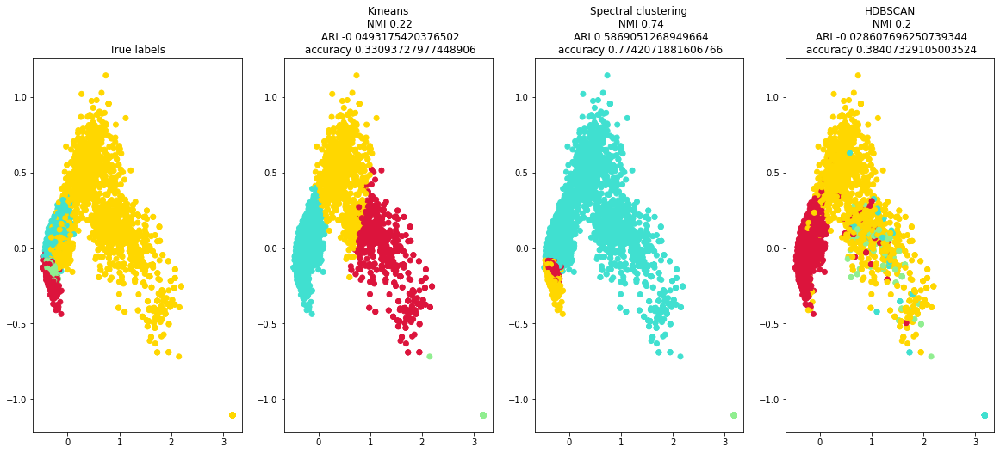

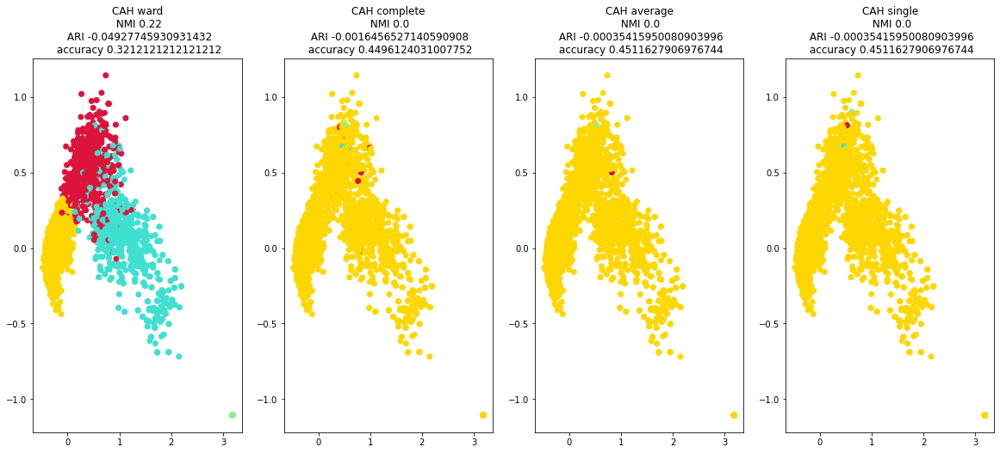

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### Glove1

In [ ]:
X=X_glove

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

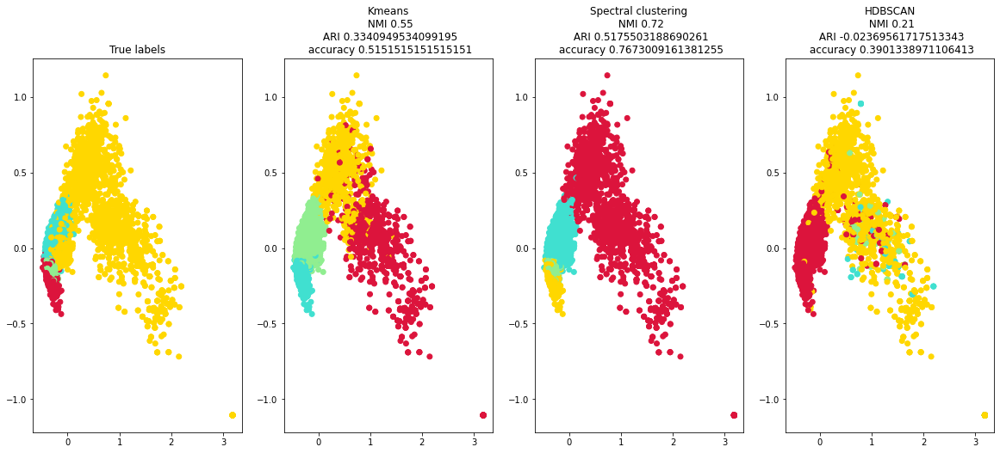

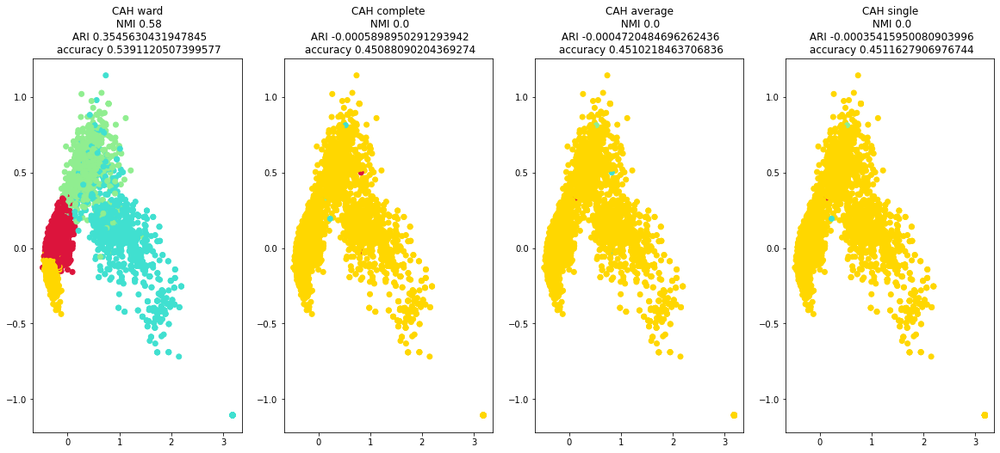

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Clustering sur les données reduites : Tandem

In [ ]:
!pip install umap.learn

     |████████████████████████████████| 86 kB 2.9 MB/s 
     |████████████████████████████████| 1.1 MB 21.1 MB/s 
  Created wheel for umap.learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=78c492bd8a0c4b4fb13f7089e02c76aafecfad28624d886df396b1a0cd7f1a21
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=4dc7c30b2048cec13fcaed7765d898ff9c03baac349e1dd68c97fe20ee2b8154
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap.learn pynndescent


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from torch.utils.data import DataLoader
import torch
from tqdm import tqdm

In [ ]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
    if seed is not None:
      torch.manual_seed(seed)
    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)

          loss = loss_function(reconstructed, batch)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

### Word2vec

In [ ]:
X=X_w2v

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)
100%|██████████| 50/50 [00:16<00:00,  3.12it/s]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

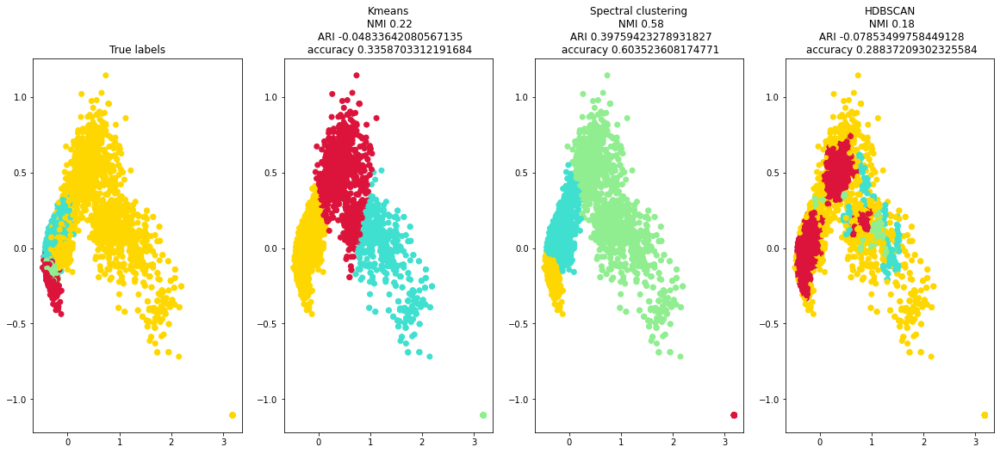

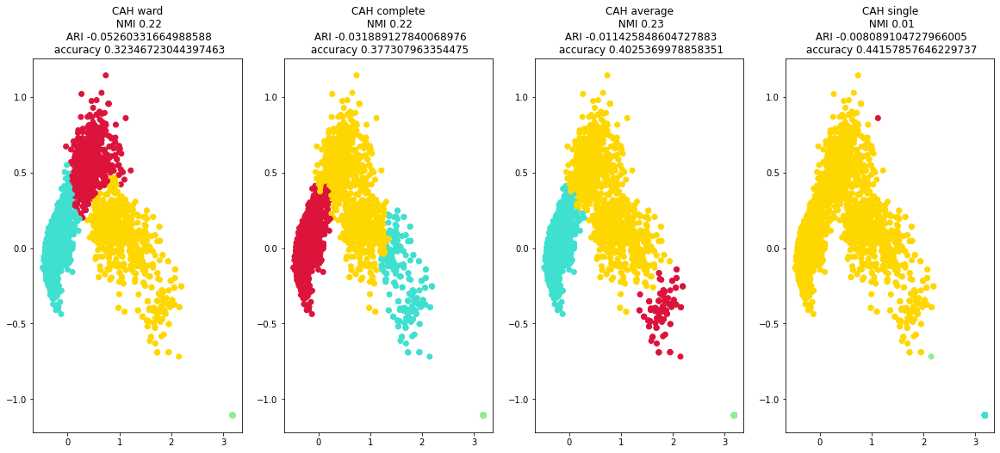

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

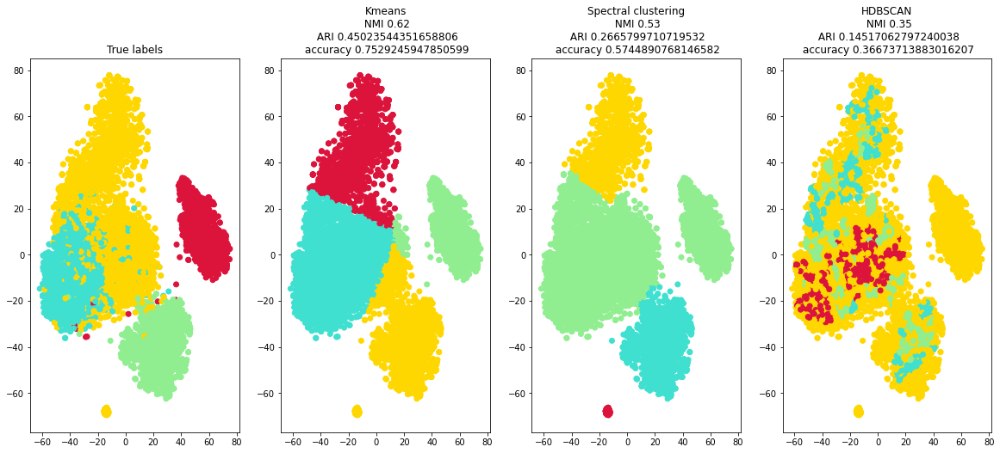

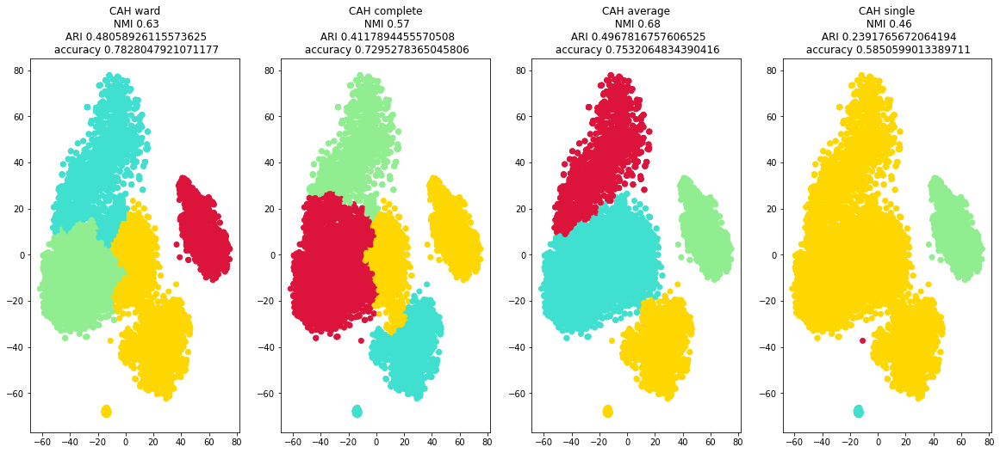

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

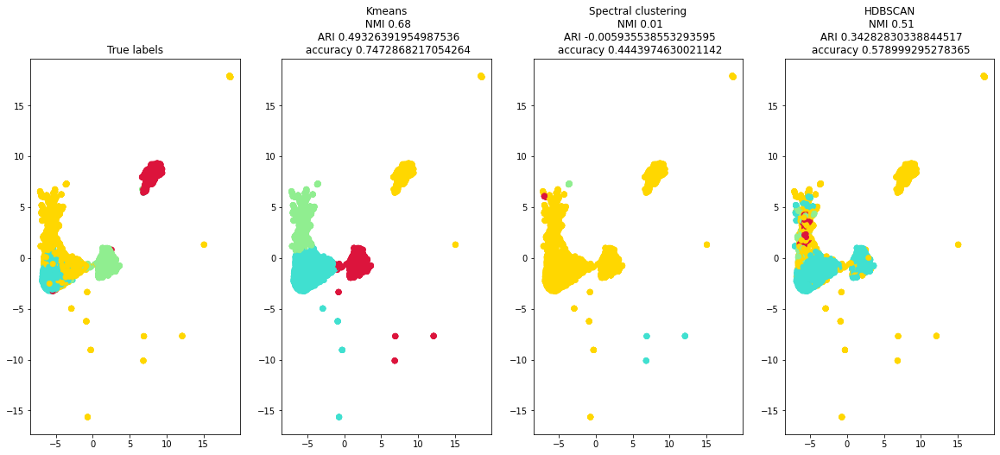

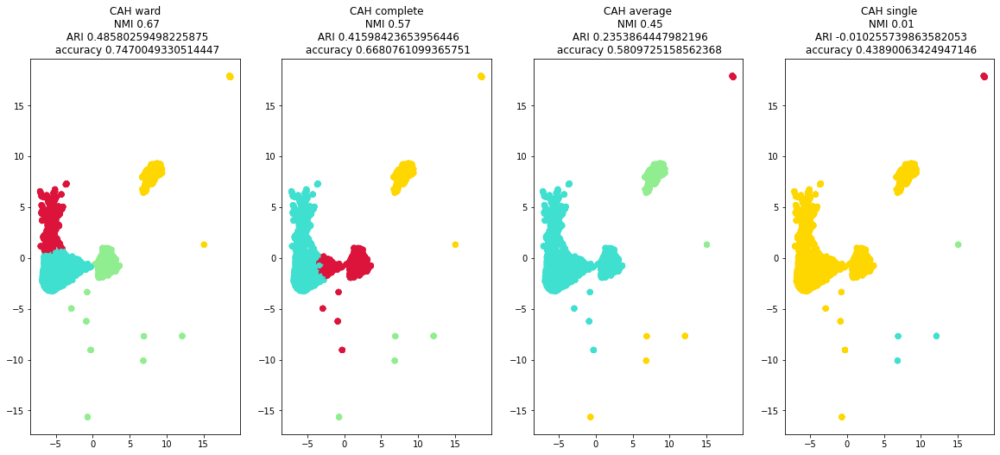

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

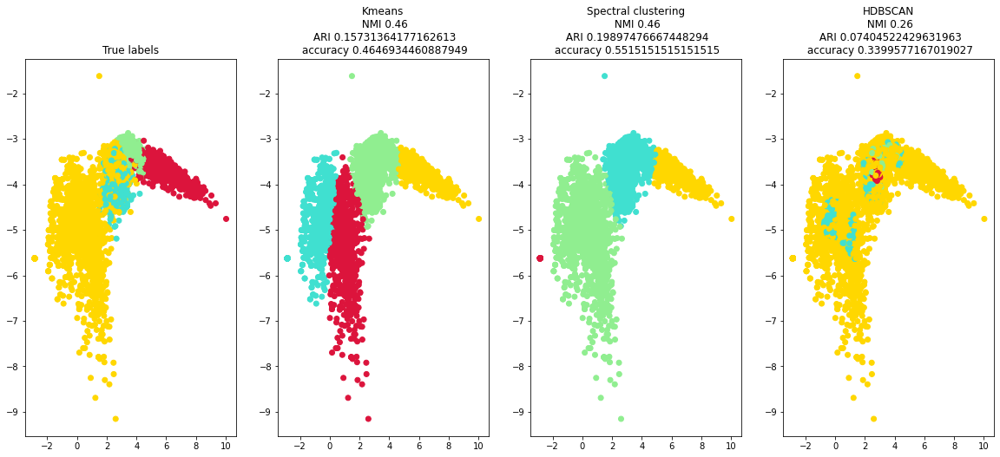

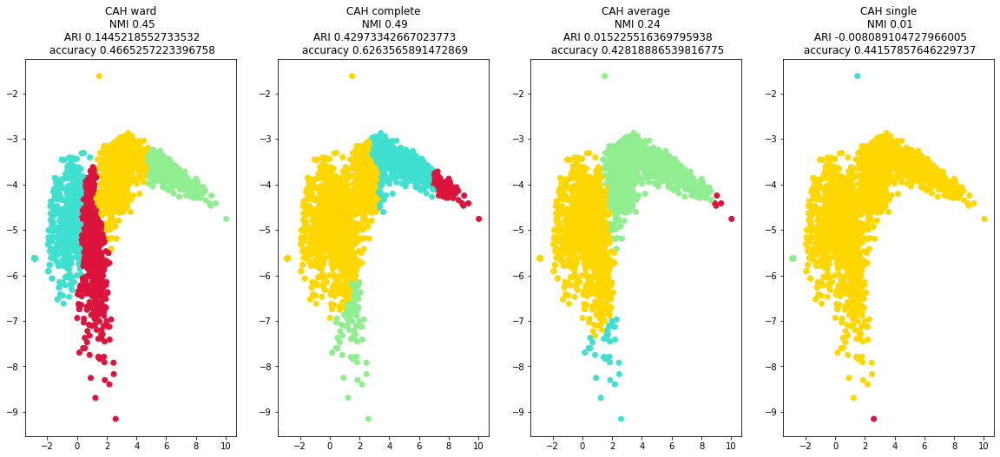

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### GloVe

In [ ]:
X=X_glove

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:15<00:00,  3.14it/s]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

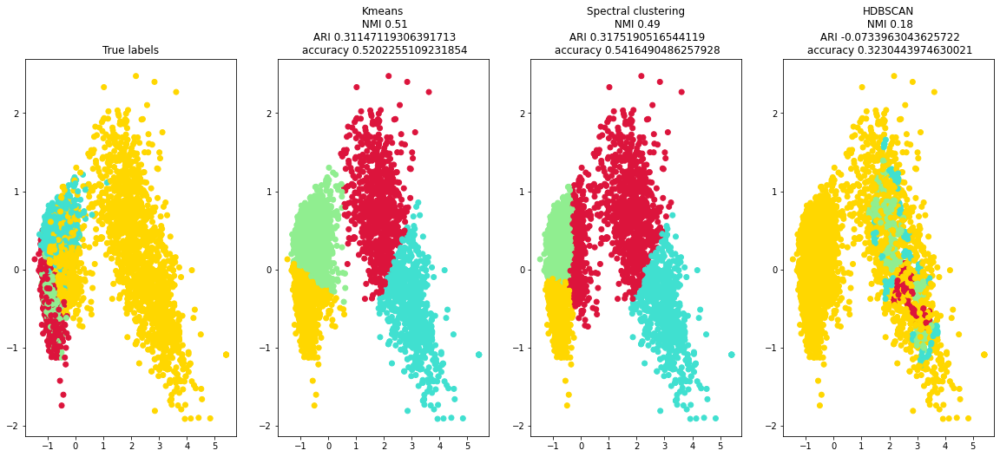

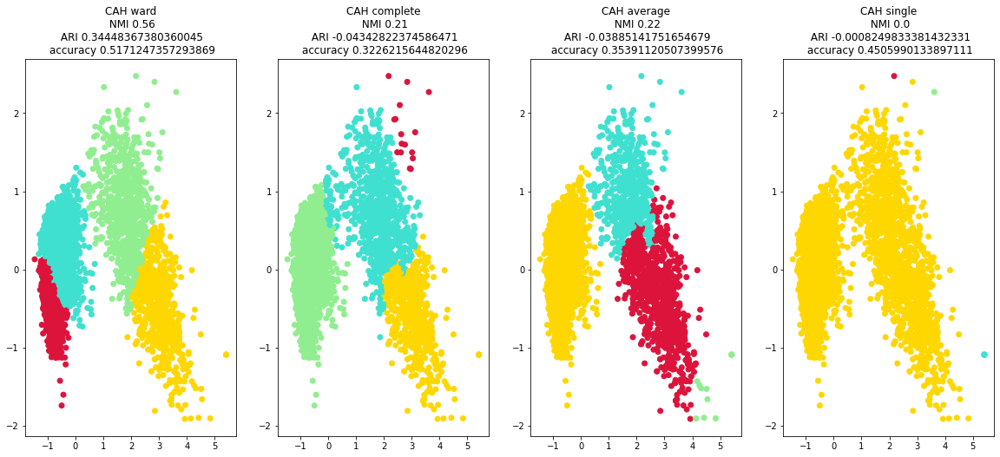

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

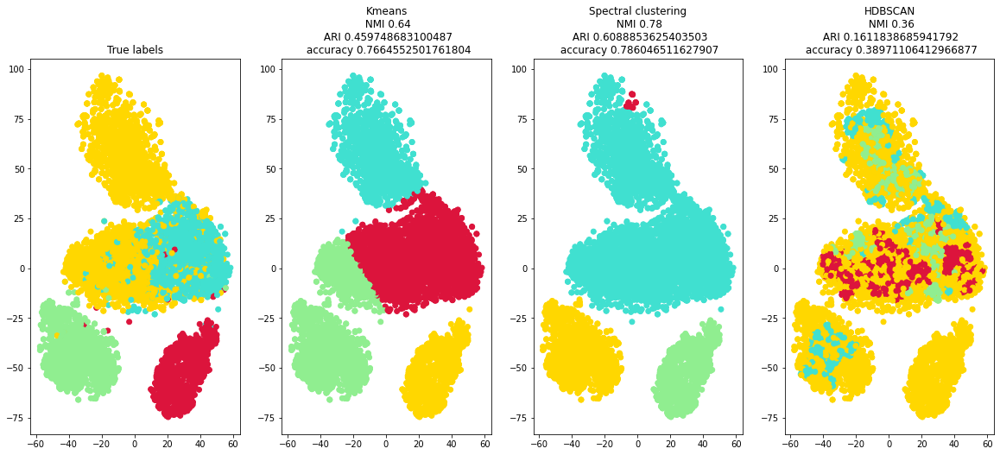

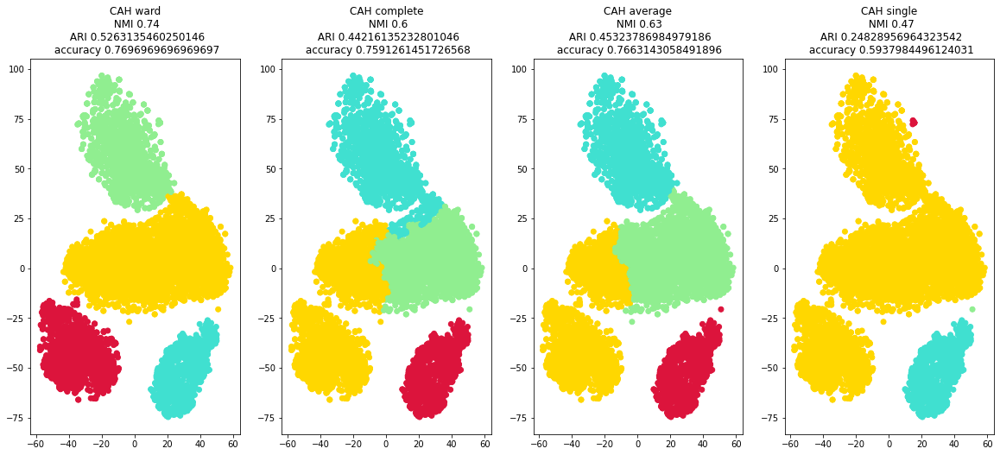

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

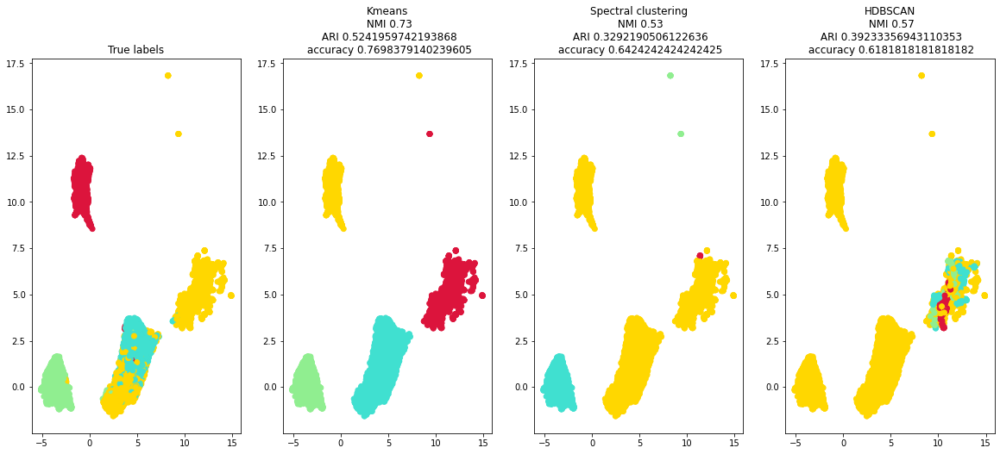

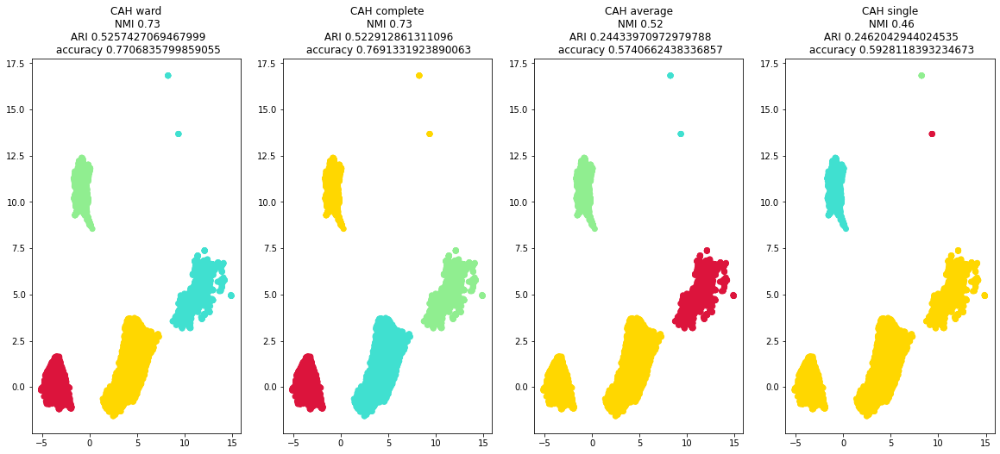

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

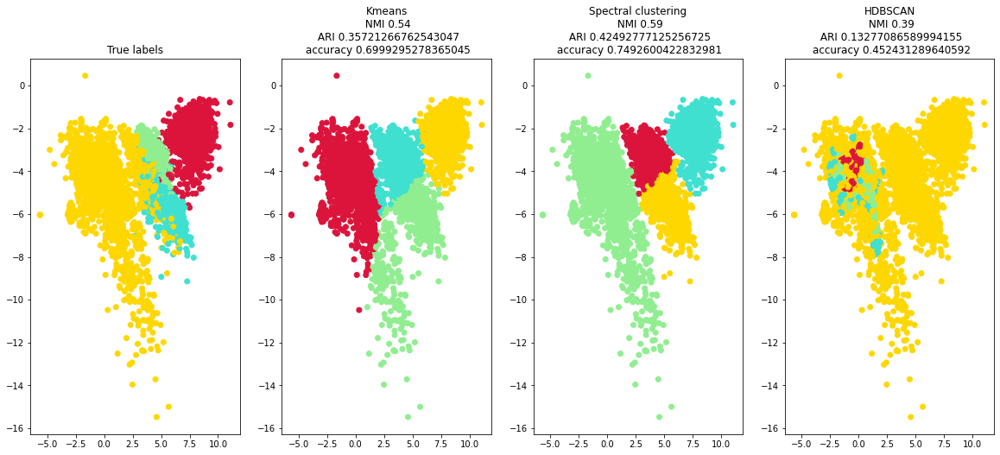

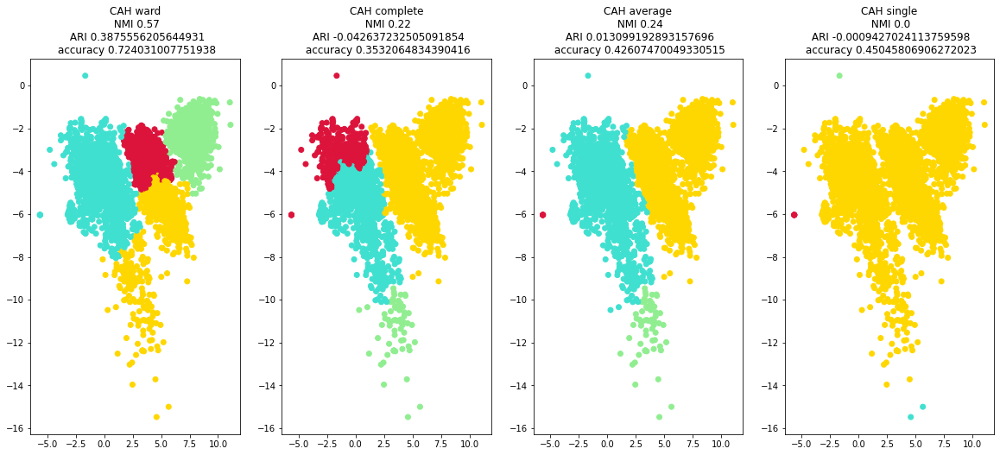

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Méthodes combinées

### Word2vac

In [ ]:
X=X_w2v

In [ ]:
!pip install rpy2

In [ ]:
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

In [ ]:
from rpy2.robjects.packages import importr
utils= importr('utils')

In [ ]:
utils.install_packages('FCPS', repos="https://cloud.r-project.org")

In [ ]:
fcps=importr('FCPS')

In [ ]:
utils.install_packages('clustrd')

In [ ]:
def eval_clustering_2(X_reduced, labels, model1,  title0, title1):

    colors = ['gold','turquoise','lightgreen','crimson']
    plt.subplots(1,2,figsize=(20,8))

    plt.subplot(1, 2, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 2, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(rkm_pred_labels, labels_int),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

R[write to console]: Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



  |======================================================================| 100%

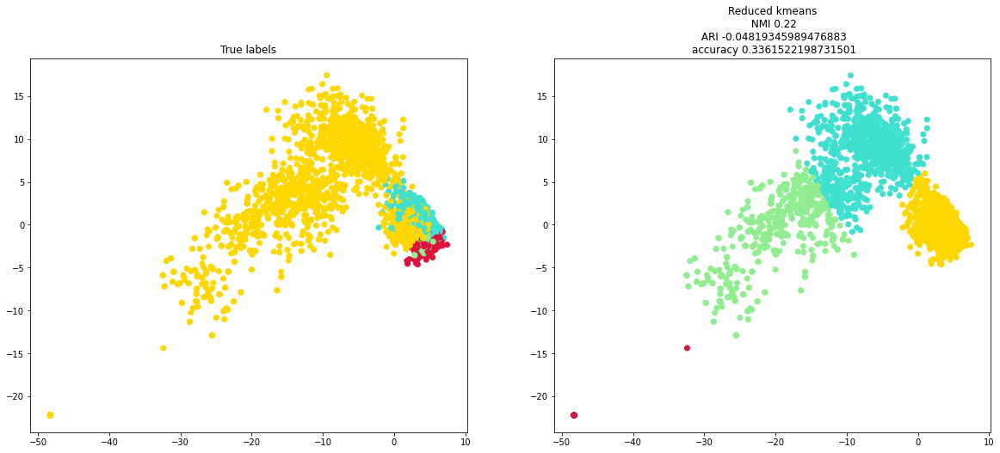

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(fkm_pred_labels, labels_int),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

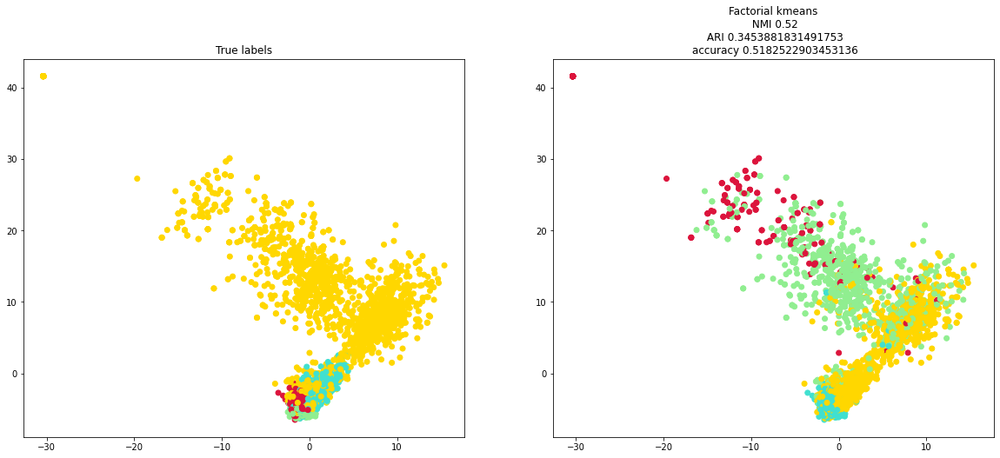

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
import os
import math
import tensorflow.compat.v1 as tf

In [ ]:
"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})

        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]

    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dcn_pred_labels, labels_int),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:06<00:00,  7.34it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:27<00:00,  1.84it/s]


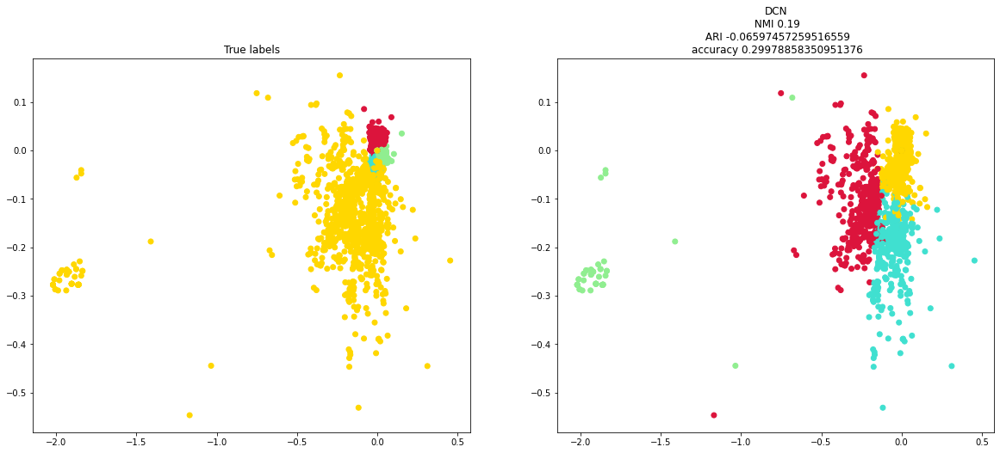

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dkm_pred_labels, labels_int),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:05<00:00,  8.45it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:21<00:00,  1.07s/it]


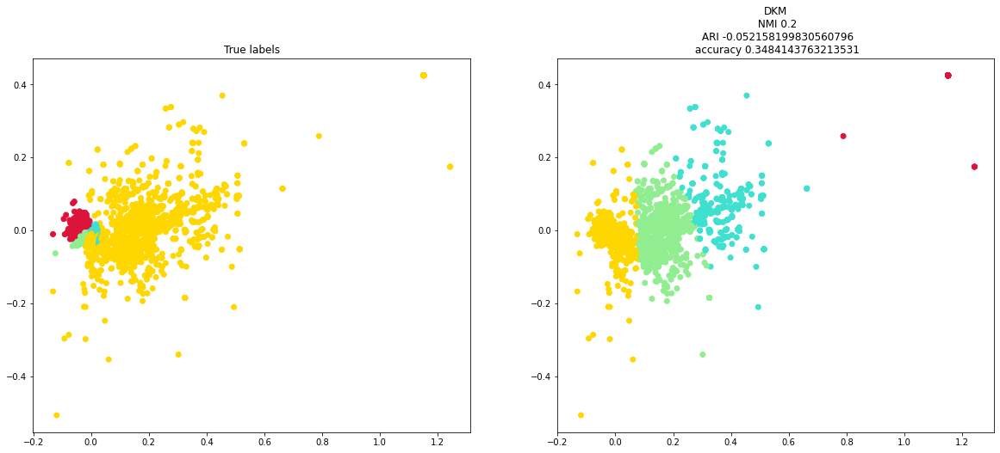

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

### Glove1

In [ ]:
X=X_glove

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(rkm_pred_labels, labels_int),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

  |======================================================================| 100%

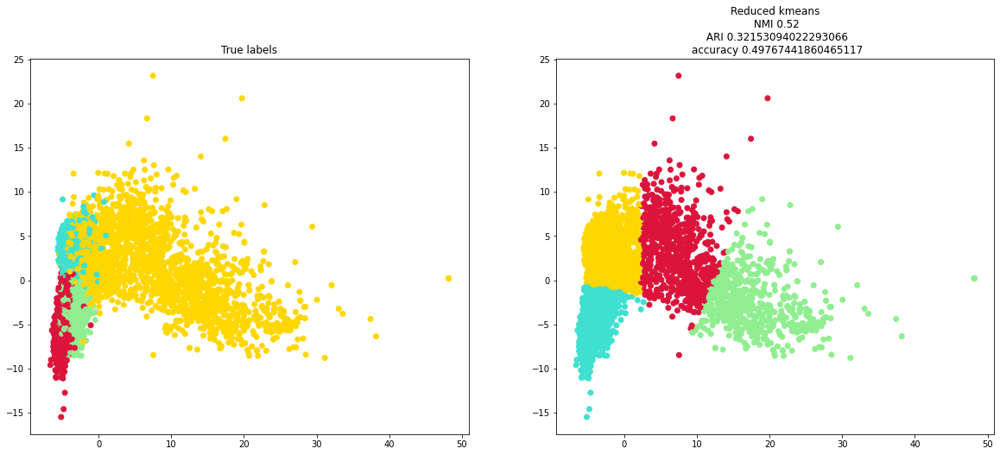

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

>#### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(fkm_pred_labels, labels_int),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

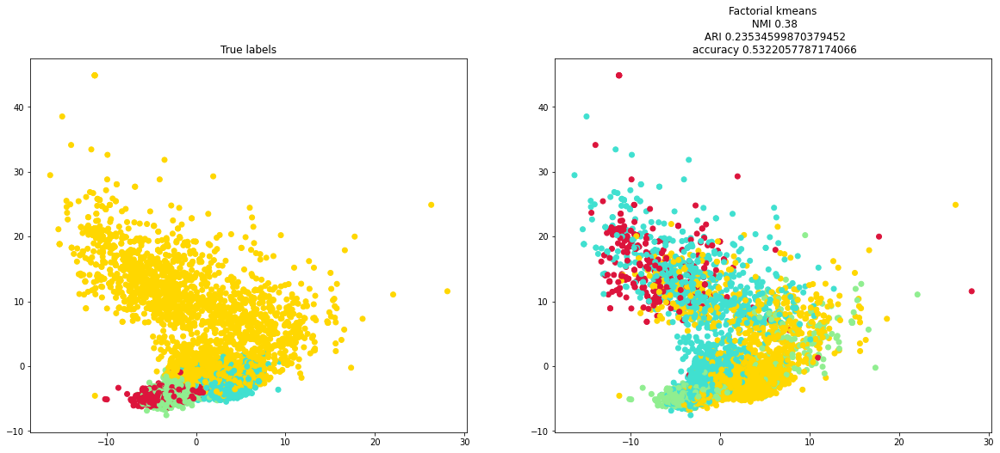

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dcn_pred_labels, labels_int),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:05<00:00,  9.16it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:28<00:00,  1.75it/s]


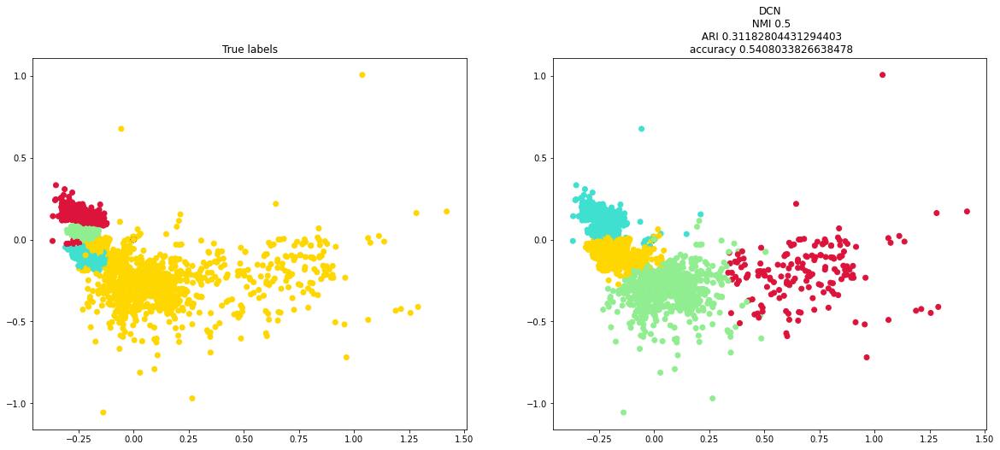

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dkm_pred_labels, labels_int),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:06<00:00,  8.26it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:21<00:00,  1.08s/it]


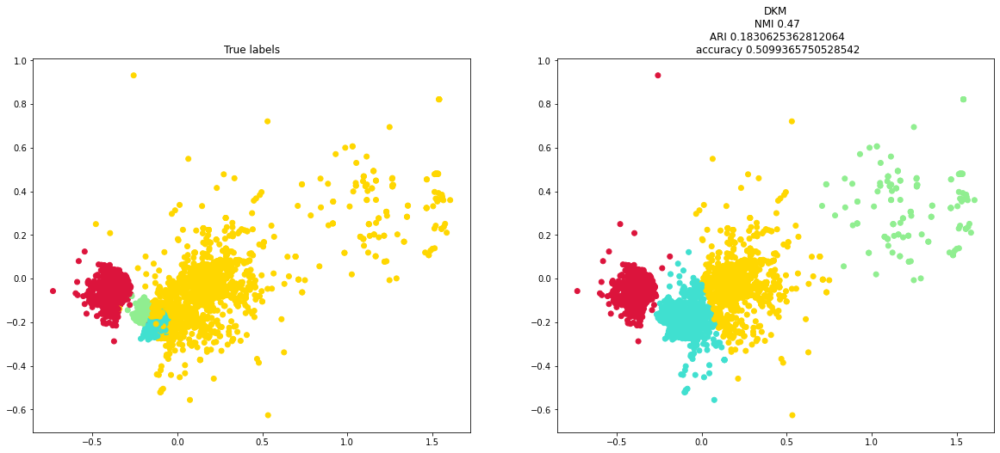

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

# Dataset BBC

## Importation du dataset

In [ ]:
#bbc
url='https://drive.google.com/file/d/1vK6cG924aVxeVL7di_xfGHibL7TwNsjg/view'
url2='https://drive.google.com/uc?id=' + url.split('/')[-2]
bbc= pd.read_csv(url2)

texts = bbc['text'].values
labels = bbc['label'].values
k=5

In [ ]:
len(texts)

2225

## Representation textuelle

### Word2vec

In [ ]:
! wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz" #Word2vec

--2021-12-05 11:19:51--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.10.197
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.10.197|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: ‘GoogleNews-vectors-negative300.bin.gz’

GoogleNews-vectors- 100%[===================>]   1.53G  46.6MB/s    in 35s     

2021-12-05 11:20:27 (44.6 MB/s) - ‘GoogleNews-vectors-negative300.bin.gz’ saved [1647046227/1647046227]



In [ ]:
def tokenize_re(text, min_len=2):
    tokens = token_pattern.findall(text)
    return [x for x in tokens if len(x) >= min_len]

In [ ]:
import re
token_pattern = r"(?u)\b\w\w+\b"
token_pattern = re.compile(token_pattern)

In [ ]:
def static_document_embeddings(word_embedding_func, docs, tokenizer, n_dims=300):
    """
        Given a set of tokenized sentences, compute the mean vector of w2v vectors for each sentence
    """
    doc_vectors = []
    for doc in docs:
        doc = tokenizer(doc)
        word_vectors = []
        for word in doc:
            vector = word_embedding_func(word)
            if vector is not None:
                word_vectors.append(vector)
        if word_vectors:
            doc_vector = np.array(word_vectors).mean(axis=0)
        else:
            warnings.warn("Zeros returned. Words not in vocabulary \"{}\"".format(doc), Warning)
            doc_vector = np.array([0] * n_dims)

        doc_vectors.append(doc_vector)
    return np.array(doc_vectors)

In [ ]:
from gensim.models import KeyedVectors

w2v_model= KeyedVectors.load_word2vec_format("GoogleNews-vectors-negative300.bin.gz", binary=True)

In [ ]:
get_w2v_vector=lambda x: w2v_model[x] if x in w2v_model.vocab else None

In [ ]:
X_w2v= static_document_embeddings(get_w2v_vector, texts, tokenize_re)
X_w2v.shape

(2225, 300)

In [ ]:
del w2v_model

### GloVe1

In [ ]:
! wget -c "https://nlp.stanford.edu/data/glove.840B.300d.zip"

--2021-12-05 11:22:58--  https://nlp.stanford.edu/data/glove.840B.300d.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.840B.300d.zip [following]
--2021-12-05 11:22:58--  http://downloads.cs.stanford.edu/nlp/data/glove.840B.300d.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2176768927 (2.0G) [application/zip]
Saving to: ‘glove.840B.300d.zip’

glove.840B.300d.zip 100%[===================>]   2.03G  5.06MB/s    in 6m 50s  

2021-12-05 11:29:49 (5.06 MB/s) - ‘glove.840B.300d.zip’ saved [2176768927/2176768927]



In [ ]:
! unzip glove.840B.300d.zip

Archive:  glove.840B.300d.zip
  inflating: glove.840B.300d.txt     


In [ ]:
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

In [ ]:
glove_file = './glove.840B.300d.txt'
tmp_file = get_tmpfile("test_word2vec.txt")

_ = glove2word2vec(glove_file, tmp_file)


In [ ]:
glove_model = KeyedVectors.load_word2vec_format(tmp_file, binary= False)

In [ ]:
get_glove_vector=lambda x: glove_model[x] if x in glove_model.vocab else None

In [ ]:
X_glove= static_document_embeddings(get_glove_vector, texts, tokenize_re)
X_glove.shape

(2225, 300)

In [ ]:
del glove_model

## Clustering sur les données d'origine

In [ ]:
!pip install hdbscan

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
import  hdbscan
from sklearn.cluster import AgglomerativeClustering

import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

In [ ]:
#Define an accuracy function

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)


def accuracy(true_row_labels, predicted_row_labels):
    """Get the best accuracy.

    Parameters
    ----------
    true_row_labels: array-like
        The true row labels, given as external information
    predicted_row_labels: array-like
        The row labels predicted by the model

    Returns
    -------
    float
        Best value of accuracy
    """

    cm = confusion_matrix(true_row_labels, predicted_row_labels)
    indexes = linear_sum_assignment(_make_cost_m(cm))
    total = 0
    for row, column in zip(*indexes):
        value = cm[row][column]
        total += value

    return (total * 1. / np.sum(cm))

### Word2vec

In [ ]:
X=X_w2v

In [ ]:
#Encode labels
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
le.fit(labels)
labels_int= le.transform(labels)

In [ ]:
def eval_clustering_7(X_reduced, labels, model1, model2, model3, model4, model5, model6, model7, title0, title1, title2, title3, title4,
                      title5, title6,title7):

    colors = ['gold','turquoise','lightgreen','crimson', 'Black']
    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model2["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title2+ "\n NMI "+str(model2["NMI"])+"\n ARI "+str(model2["ARI"])+"\n accuracy "+str(model2["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model3["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title3+"\n NMI "+str(model3["NMI"])+"\n ARI "+str(model3["ARI"])+"\n accuracy "+str(model3["accuracy"]))

    plt.subplots(1,4,figsize=(20,8))

    plt.subplot(1, 4, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model4["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title4 +"\n NMI "+str(model4["NMI"])+"\n ARI "+str(model4["ARI"])+"\n accuracy "+str(model4["accuracy"]))

    plt.subplot(1, 4, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model5["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title5 +"\n NMI "+str(model5["NMI"])+"\n ARI "+str(model5["ARI"])+"\n accuracy "+str(model5["accuracy"]))

    plt.subplot(1, 4, 3)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model6["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title6+ "\n NMI "+str(model6["NMI"])+"\n ARI "+str(model6["ARI"])+"\n accuracy "+str(model6["accuracy"]))

    plt.subplot(1, 4, 4)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model7["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title7+"\n NMI "+str(model7["NMI"])+"\n ARI "+str(model7["ARI"])+"\n accuracy "+str(model7["accuracy"]))

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}


In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

In [ ]:
#PCA for visualisation
X_reduced=PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)

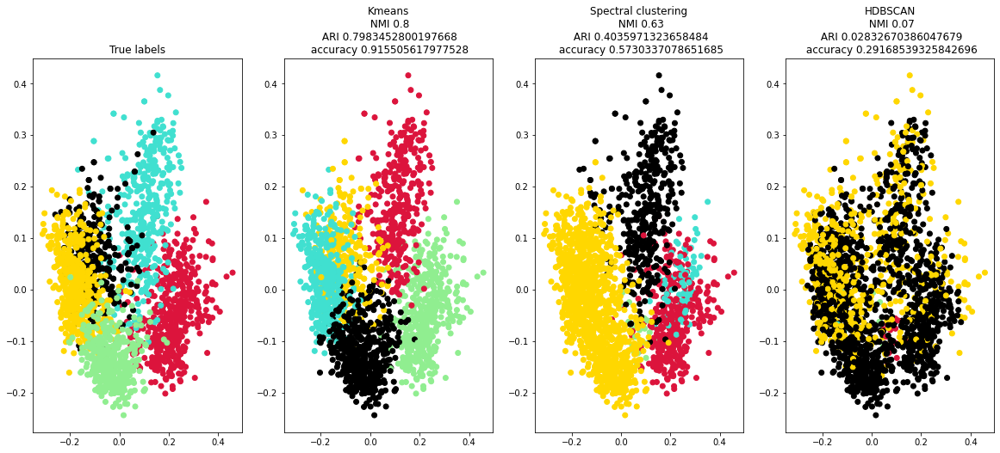

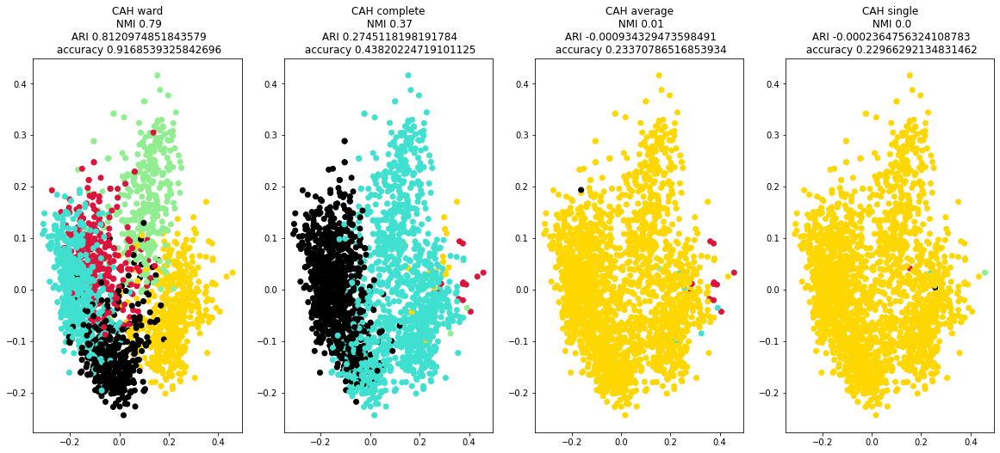

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### Glove1

In [ ]:
X=X_glove

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
 #Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

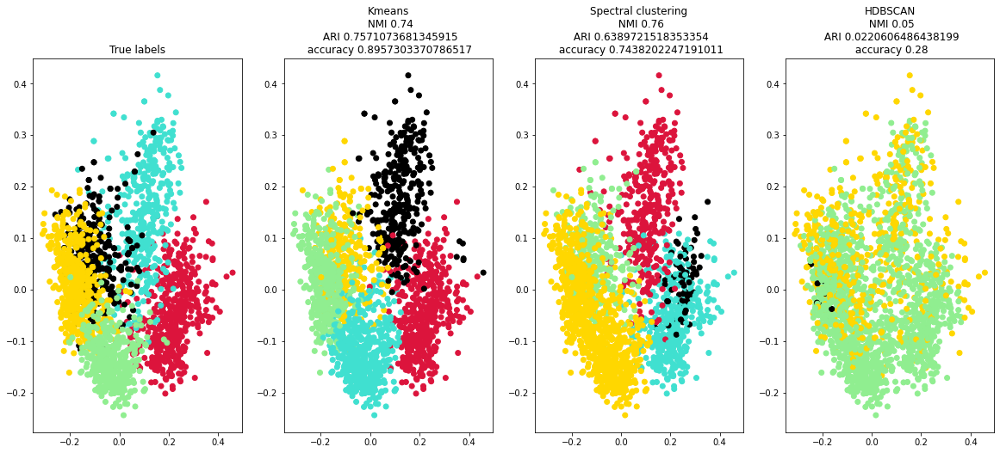

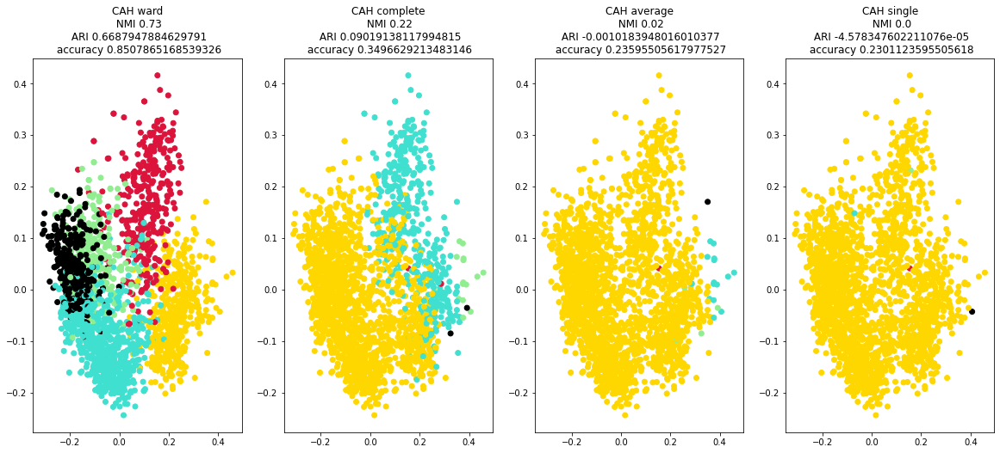

In [ ]:
eval_clustering_7(X_reduced, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Clustering sur les données reduites : Tandem

In [ ]:
!pip install umap.learn

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from torch.utils.data import DataLoader
import torch
from tqdm import tqdm

In [ ]:
class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim
        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.embedding_dim)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, self.input_dim),
            torch.nn.Sigmoid()
        )
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'
    if seed is not None:
      torch.manual_seed(seed)
    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)

          loss = loss_function(reconstructed, batch)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

### Word2vec

In [ ]:
X=X_w2v

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:05<00:00,  8.91it/s]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

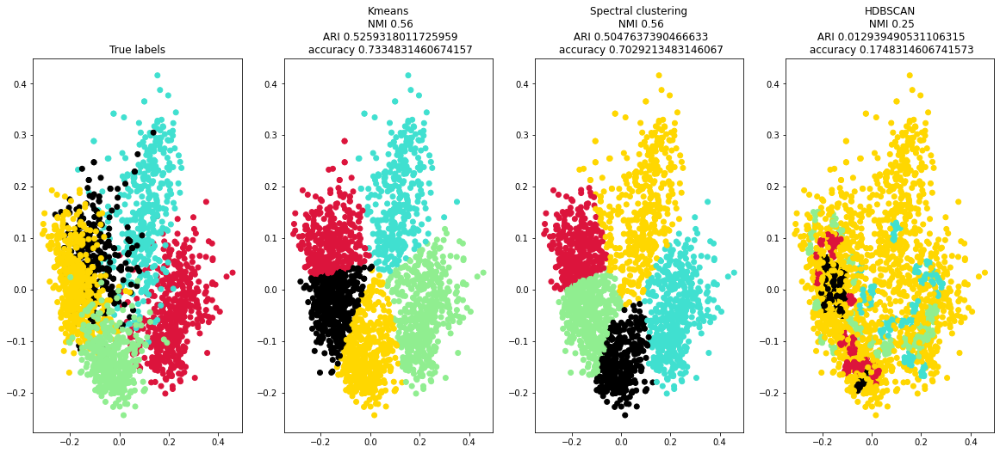

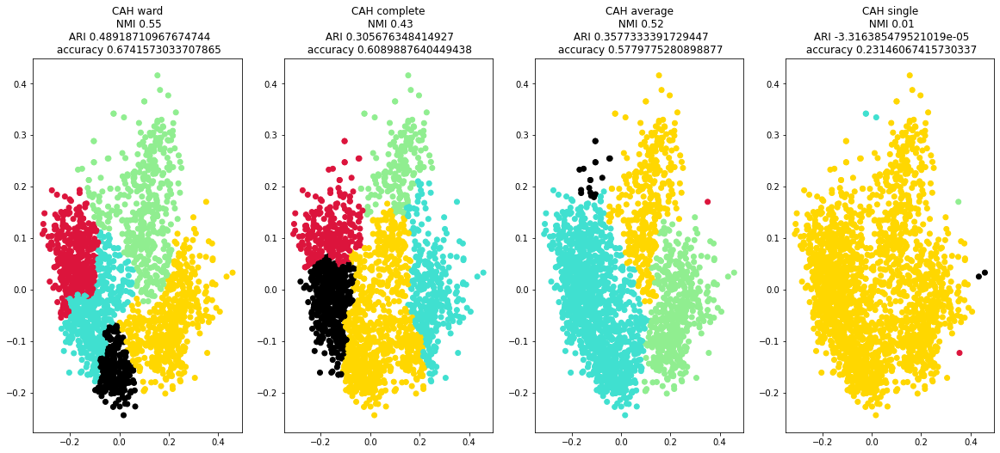

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

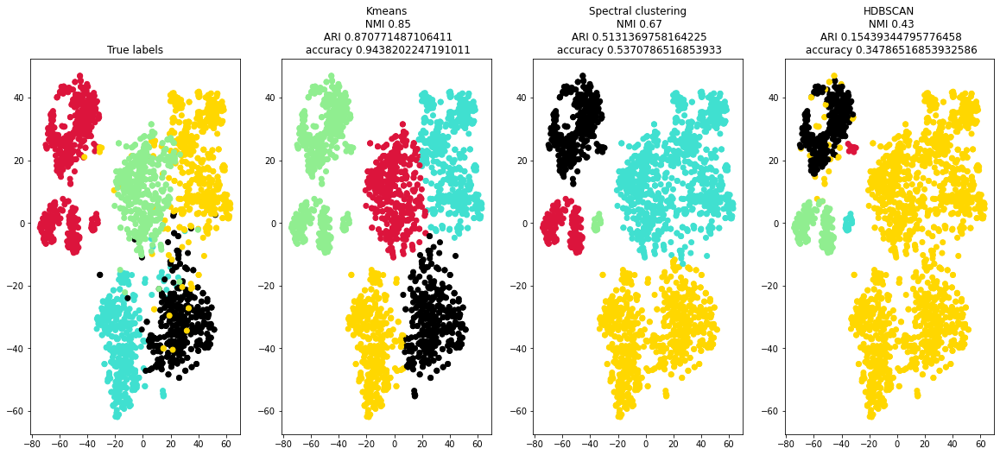

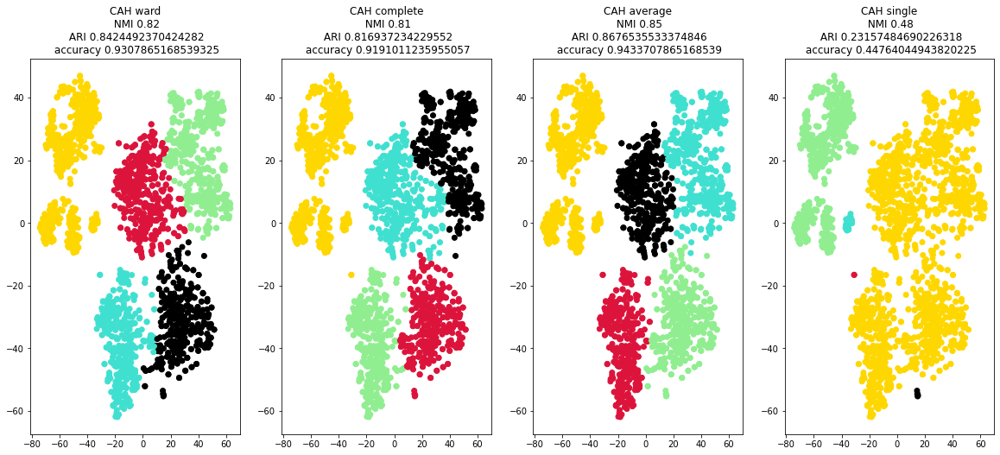

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

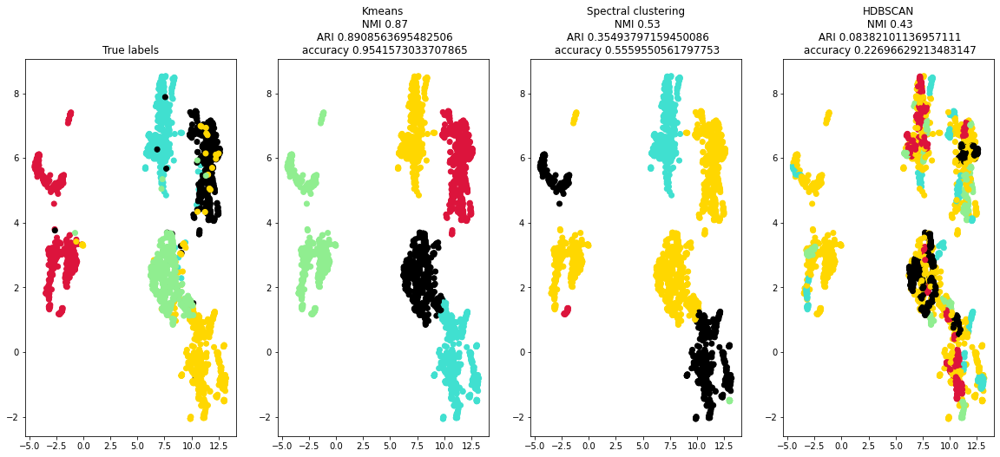

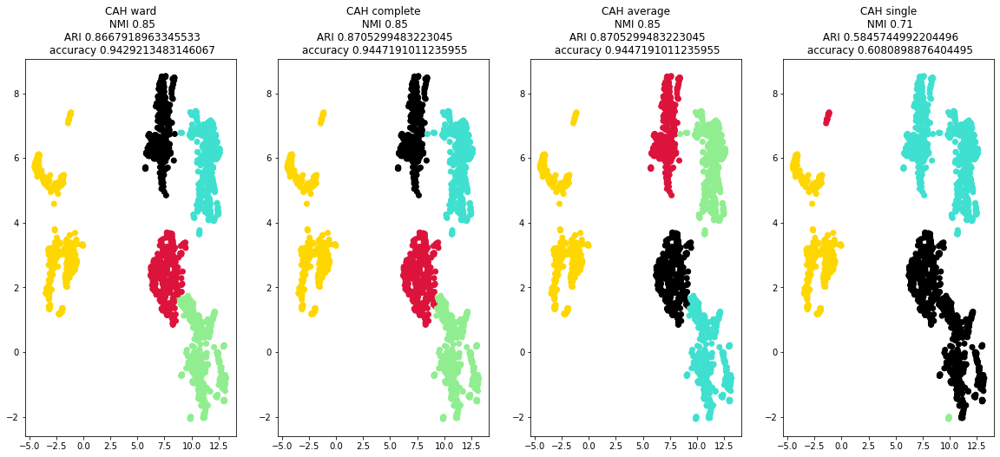

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

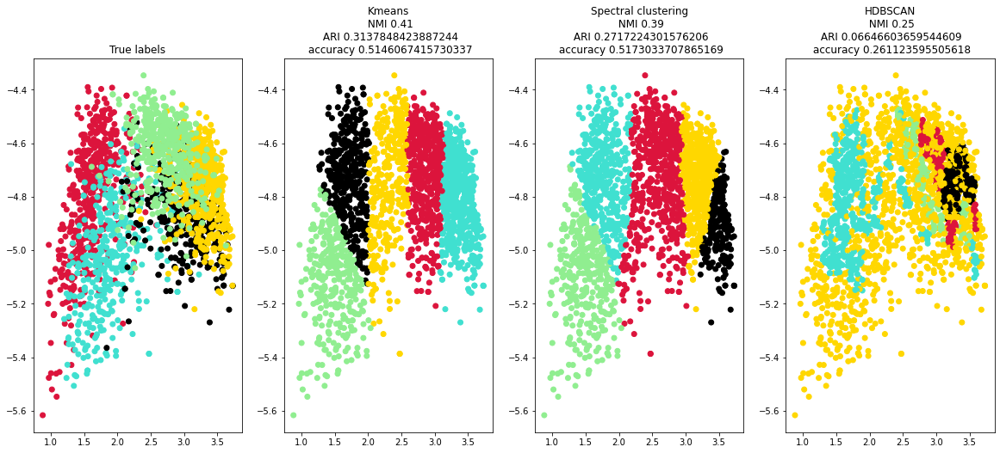

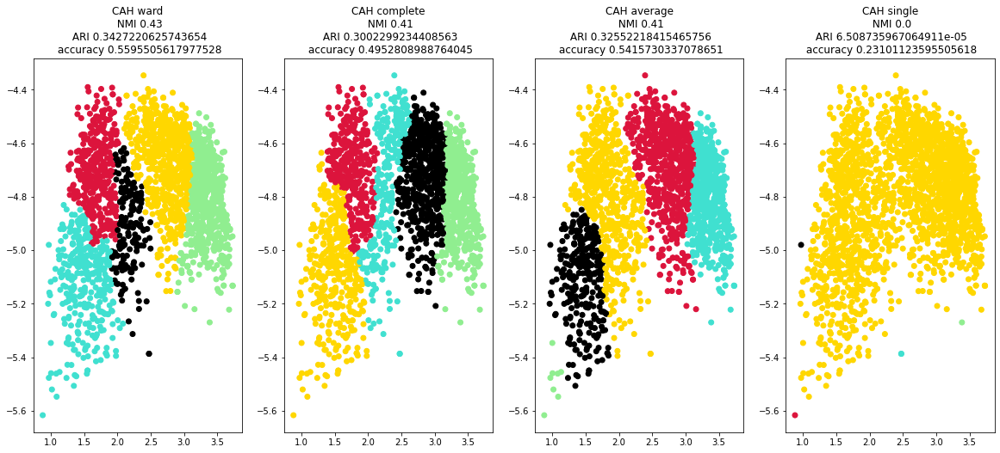

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

### GloVe

In [ ]:
X=X_glove

In [ ]:
#PCA
X_reduced_PCA =PCA(n_components=2, whiten=False, random_state=42).fit_transform(X)
#t-SNE
X_reduced_TSNE =TSNE(n_components=2, random_state=42).fit_transform(X)
#UMAP
X_reduced_UMAP =UMAP(n_components=2, random_state=42).fit_transform(X)
#Authoencoder
X_reduced_autoencoder =autoencoder(X.astype("float32"), 2, seed=42)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
100%|██████████| 50/50 [00:05<00:00,  9.31it/s]


> #### PCA

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_PCA).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_PCA).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_PCA).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_PCA).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_PCA).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_PCA).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_PCA).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

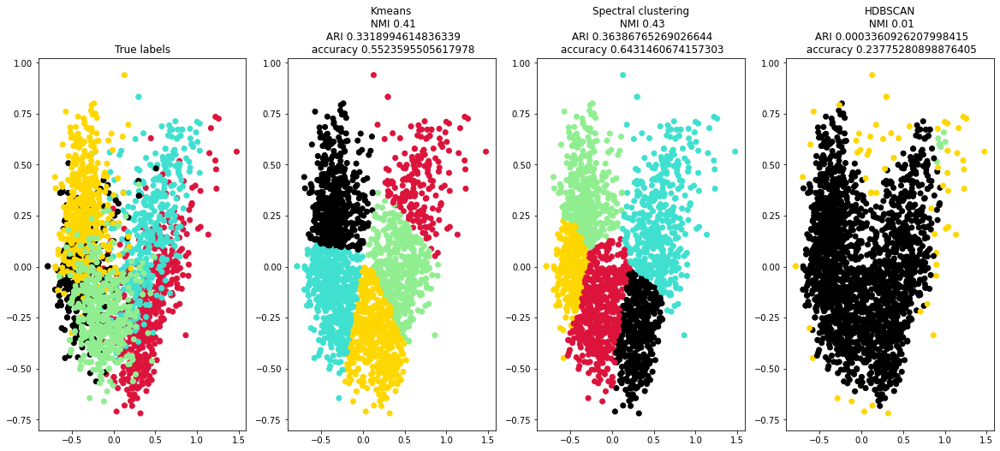

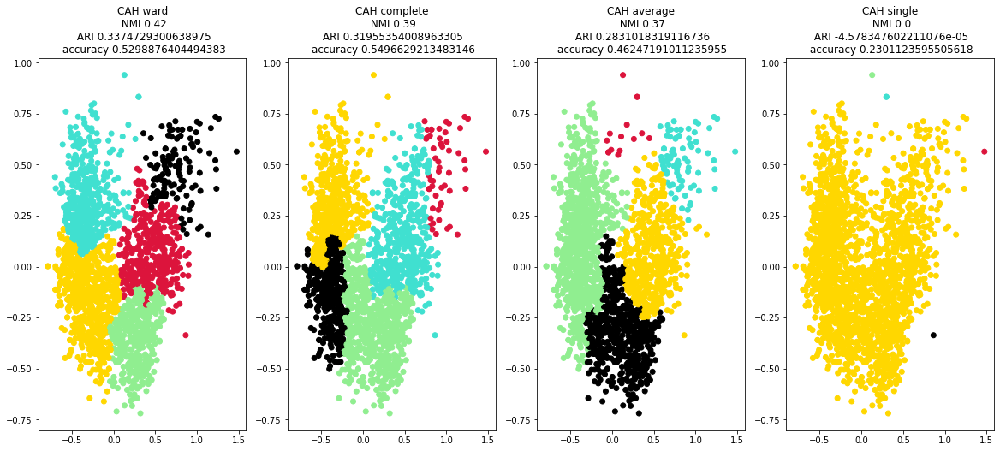

In [ ]:
eval_clustering_7(X_reduced_PCA, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### t-SNE

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_TSNE).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_TSNE).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_TSNE).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_TSNE).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_TSNE).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_TSNE).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_TSNE).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

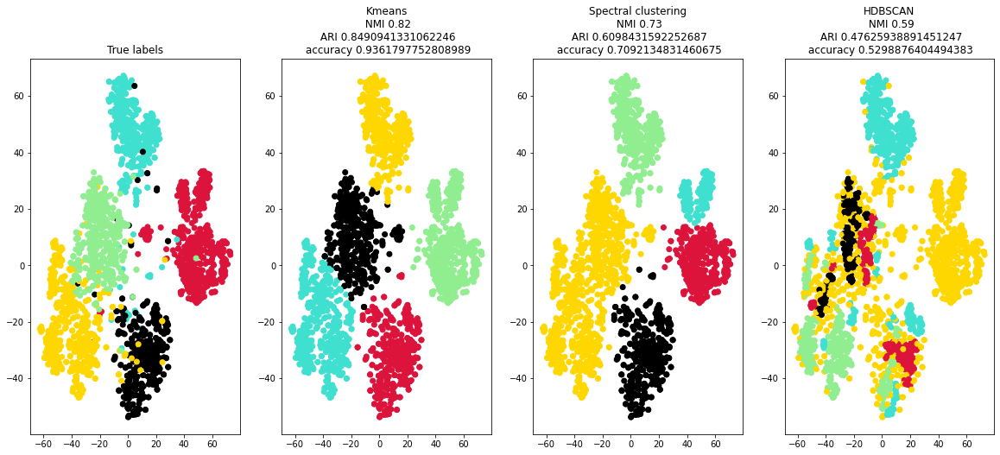

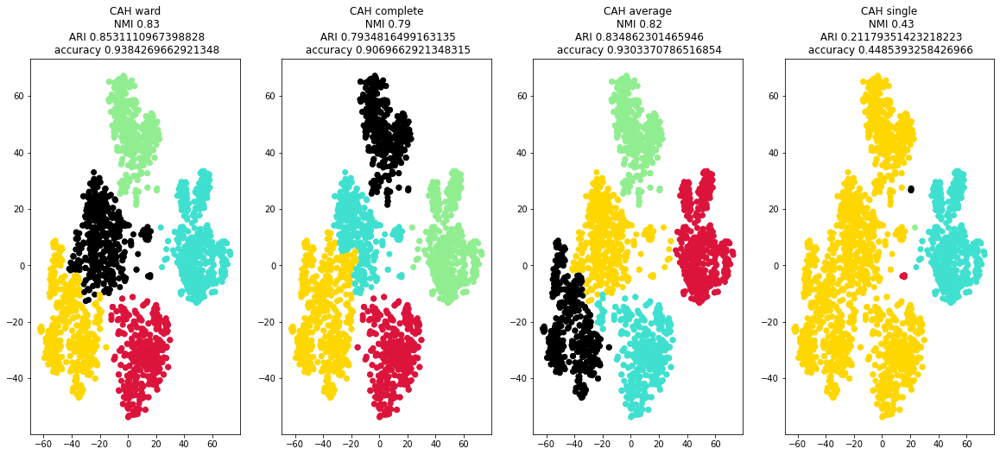

In [ ]:
eval_clustering_7(X_reduced_TSNE, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### UMAP

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_UMAP).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_UMAP).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_UMAP).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_UMAP).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_UMAP).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_UMAP).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_UMAP).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

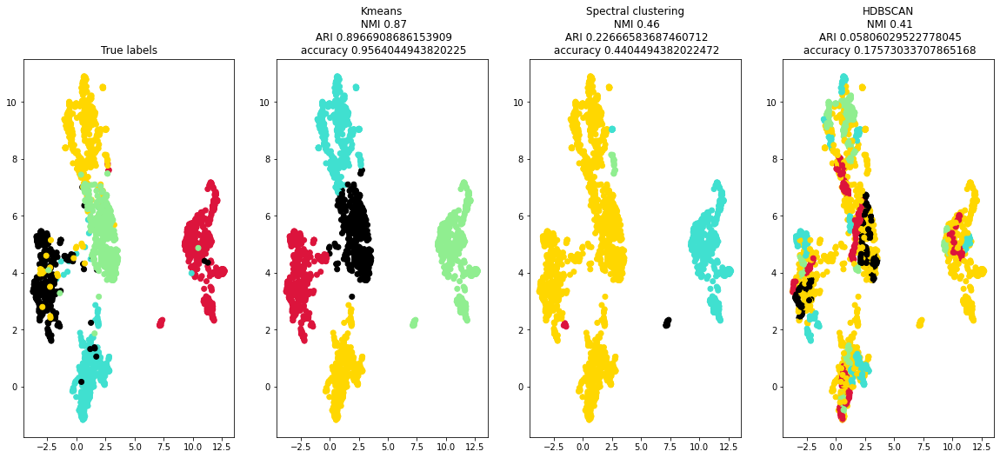

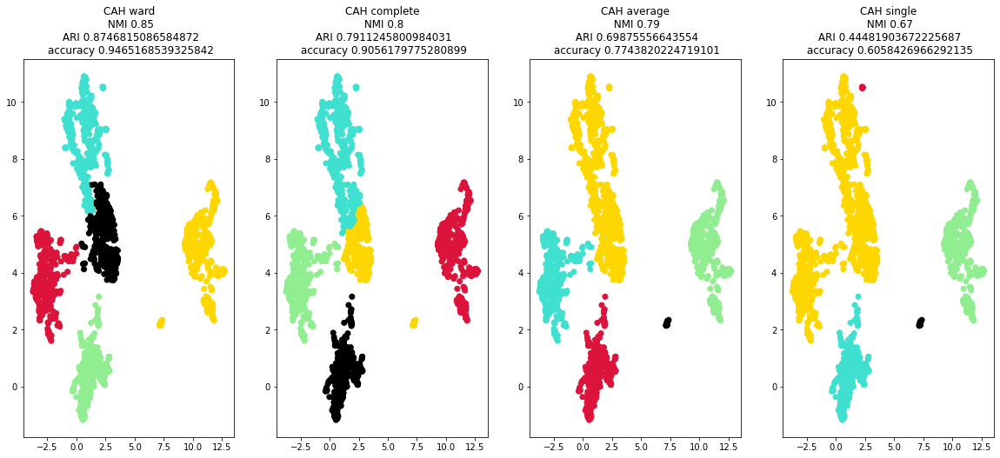

In [ ]:
eval_clustering_7(X_reduced_UMAP, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

> #### Autoencoders

In [ ]:
#Kmeans
kmeans_pred_labels=KMeans(k, random_state=42).fit(X_reduced_autoencoder).labels_
kmeans={"labels": kmeans_pred_labels,
        "NMI": round(normalized_mutual_info_score(kmeans_pred_labels, labels_int),2),
        "ARI": adjusted_rand_score(kmeans_pred_labels, labels_int),
        "accuracy": accuracy(kmeans_pred_labels, labels_int)}

In [ ]:
#Spectral clustering
sepectral_pred_labels=SpectralClustering(k, affinity='nearest_neighbors', n_neighbors=10, random_state=42).fit(X_reduced_autoencoder).labels_

spectral_clustering= {"labels": sepectral_pred_labels,
                      "NMI": round(normalized_mutual_info_score(sepectral_pred_labels, labels_int),2),
                      "ARI": adjusted_rand_score(sepectral_pred_labels, labels_int),
                      "accuracy": accuracy(sepectral_pred_labels, labels_int)}

In [ ]:
#HDBSCAN
hdbscan_pred_labels=hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method='eom', metric='euclidean').fit(X_reduced_autoencoder).labels_

hdbscan_= {"labels": hdbscan_pred_labels,
          "NMI": round(normalized_mutual_info_score(hdbscan_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(hdbscan_pred_labels, labels_int),
          "accuracy": accuracy(hdbscan_pred_labels, labels_int)}

In [ ]:
#CAH with ward aggregation criteria
cah_ward_pred_labels=AgglomerativeClustering(k, linkage = 'ward').fit(X_reduced_autoencoder).labels_

cah_ward= {"labels": cah_ward_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_ward_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_ward_pred_labels, labels_int),
          "accuracy": accuracy(cah_ward_pred_labels, labels_int)}

In [ ]:
#CAH with complete aggregation criteria
cah_complete_pred_labels=AgglomerativeClustering(k, linkage = 'complete').fit(X_reduced_autoencoder).labels_

cah_complete= {"labels": cah_complete_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_complete_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_complete_pred_labels, labels_int),
          "accuracy": accuracy(cah_complete_pred_labels, labels_int)}

In [ ]:
#CAH with average aggregation criteria
cah_average_pred_labels=AgglomerativeClustering(k, linkage = 'average').fit(X_reduced_autoencoder).labels_

cah_average= {"labels": cah_average_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_average_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_average_pred_labels, labels_int),
          "accuracy": accuracy(cah_average_pred_labels, labels_int)}

In [ ]:
#CAH with single aggregation criteria
cah_single_pred_labels=AgglomerativeClustering(k, linkage = 'single').fit(X_reduced_autoencoder).labels_

cah_single= {"labels": cah_single_pred_labels,
          "NMI": round(normalized_mutual_info_score(cah_single_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(cah_single_pred_labels, labels_int),
          "accuracy": accuracy(cah_single_pred_labels, labels_int)}

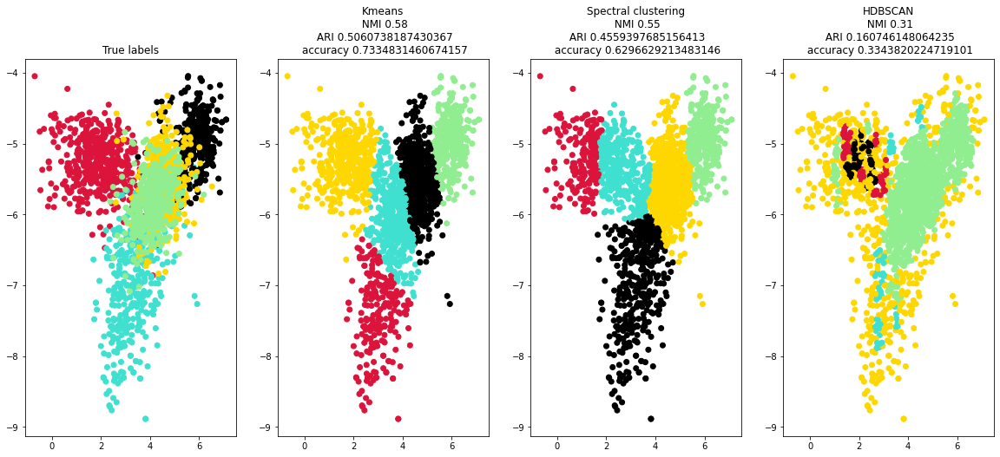

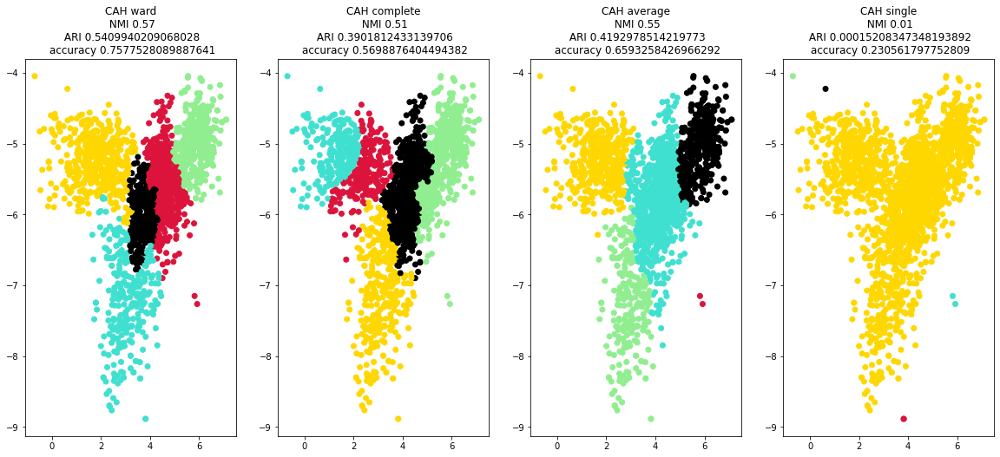

In [ ]:
eval_clustering_7(X_reduced_autoencoder, labels_int ,kmeans, spectral_clustering, hdbscan_, cah_ward, cah_complete, cah_average,
                  cah_single, "True labels", "Kmeans", "Spectral clustering", "HDBSCAN", "CAH ward", "CAH complete",
                  "CAH average", "CAH single")

## Méthodes combinées

### Word2vac

In [ ]:
X=X_w2v

In [ ]:
!pip install rpy2

In [ ]:
import rpy2.robjects.numpy2ri
rpy2.robjects.numpy2ri.activate()

In [ ]:
from rpy2.robjects.packages import importr
utils= importr('utils')

In [ ]:
utils.install_packages('FCPS', repos="https://cloud.r-project.org")

In [ ]:
fcps=importr('FCPS')

In [ ]:
utils.install_packages('clustrd')

In [ ]:
def eval_clustering_2(X_reduced, labels, model1,  title0, title1):

    colors = ['gold','turquoise','lightgreen','crimson', 'black']
    plt.subplots(1,2,figsize=(20,8))

    plt.subplot(1, 2, 1)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=labels, cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title0)

    plt.subplot(1, 2, 2)
    plt.scatter(X_reduced[:,0], X_reduced[:,1] , c=model1["labels"], cmap=matplotlib.colors.ListedColormap(colors))
    plt.title(title1 +"\n NMI "+str(model1["NMI"])+"\n ARI "+str(model1["ARI"])+"\n accuracy "+str(model1["accuracy"]))

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(rkm_pred_labels, labels_int),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

  |======================================================================| 100%

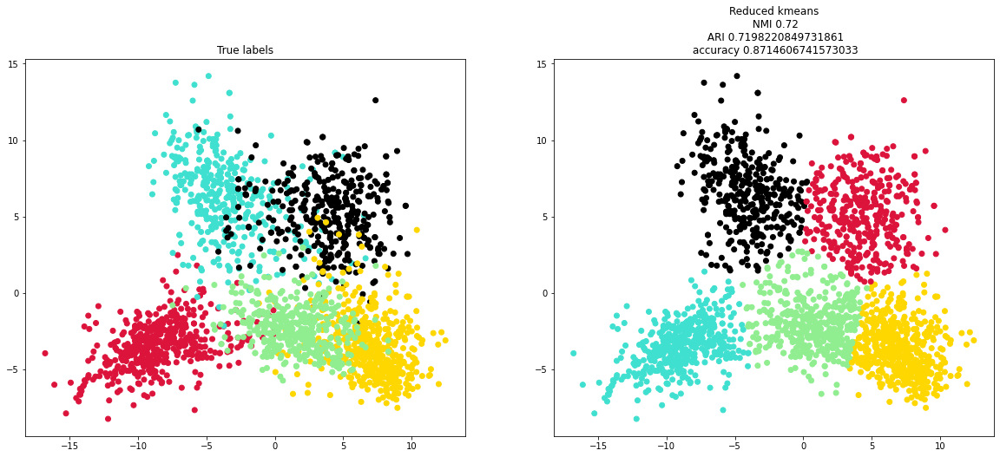

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(fkm_pred_labels, labels_int),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

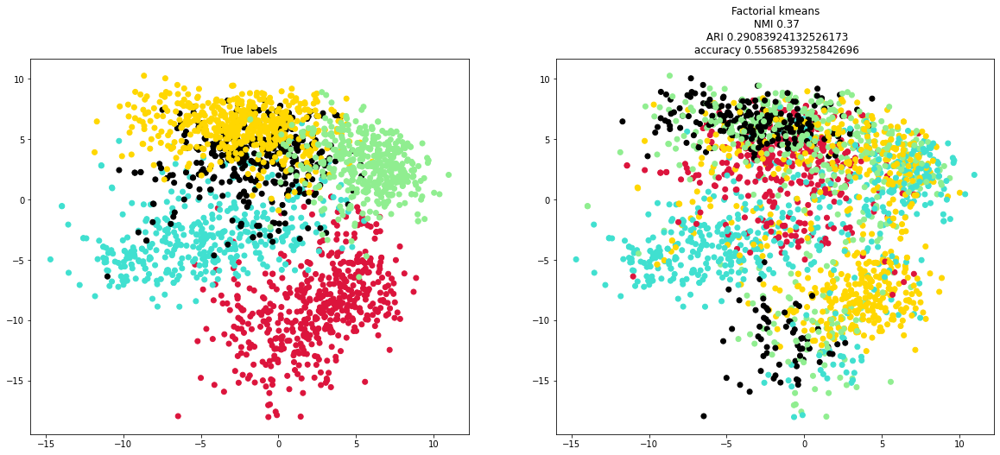

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
import os
import math
import tensorflow.compat.v1 as tf

In [ ]:
"""
  Credits:
    This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
    Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


#######################################################
############### Deep Clustering Network ###############
#######################################################

class DcnCompGraph(object):
    """Computation graph for the Deep Clustering Network model proposed in:
        Yang, B., Fu, X., Sidiropoulos, N. D., & Hong, M. (2017). Towards K-means-friendly Spaces: Simultaneous Deep
        Learning and Clustering. In ICML '17 (pp. 3861–3870).
    This implementation is inspired by https://github.com/boyangumn/DCN
    """

    def __init__(self, ae_specs, n_clusters, batch_size, n_samples, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0]) - 1) / 2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(batch_size, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g
        self.ae_loss = tf.reduce_mean(rec_error)

        # Clustering loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## Clustering assignments for all samples in the dataset
        initial_clustering_assign = tf.random_uniform(minval=0, maxval=n_clusters, dtype=tf.int32, shape=[n_samples])
        self.cluster_assign = tf.Variable(initial_clustering_assign, name='cluster_assign', dtype=tf.int32, trainable=False)

        ## Get the cluster representative corresponding to the cluster of each batch sample
        self.indices = tf.placeholder(dtype=tf.int32, shape=batch_size)  # Placeholder for sample indices in current batch
        batch_clust_rep = []
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            batch_clust_rep.append(self.cluster_rep[k, :])
        stack_batch_clust_rep = tf.stack(batch_clust_rep)

        ## Compute the k-means term
        clustering_error = f_func(self.embedding, stack_batch_clust_rep)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(clustering_error)
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DCN
        self.train_op = optimizer.minimize(self.loss)

        # As it has been pointed out in the DCN paper, first the weights of the autoencoder shall be trained then the
        # assignments and cluster representatives. So far in the computation graph we have optimized the weights of the
        # autoencoder, now it's the time for the assignments and representatives.

        # Update the clustering assignments
        for j in range(batch_size):
            # Find which cluster representative is the closest to the current batch sample
            new_assign = tf.argmin(f_func(tf.reshape(self.embedding[j, :], (1, embedding_size)), self.cluster_rep),
                                   output_type=tf.int32)
            # Update the clustering assignment
            self.cluster_assign_update = tf.assign(self.cluster_assign[self.indices[j]], new_assign)

        # Update the cluster representatives
        ## Initialize the value of count
        initial_count = tf.constant(100.0, shape=[n_clusters])
        count = tf.Variable(initial_count, name='count', dtype=TF_FLOAT_TYPE, trainable=False)
        ## Update the cluster representatives according to Equation (8) in the DCN paper
        for j in range(batch_size):
            k = self.cluster_assign[self.indices[j]]  # Clustering assignment for sample j in batch
            self.count_update = tf.assign(count[k], count[k] + 1)  # Updated count for cluster assignments
            new_rep = self.cluster_rep[k] - (1 / count[k]) * (self.cluster_rep[k] - self.embedding[j])
            self.cluster_rep_update = tf.assign(self.cluster_rep[k], new_rep)

def DCN(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    cg = DcnCompGraph([dimensions, activations, names], n_clusters, batch_size, n_samples,
                      lambda_)

    # Run the computation graph
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):

                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices_, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                       feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices_)):
                        embeddings[indices_[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DCN
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

            # The clustering assignments are used to initialize the clustering assignments in DCN
            sess.run(tf.assign(cg.cluster_assign, kmeans_model.labels_))

        # Train the full DCN model
        print("Starting DCN training...")
        ## Loop over epochs
        for epoch in tqdm(range(n_finetuning_epochs)):
            # print("Training step: epoch {}".format(epoch))

            # Loop over the samples
            for _ in range(n_batches):
                # Fetch a random data batch of the specified size
                indices_, data_batch = next_batch(batch_size, data)

                # Run the computation graph on the data batch
                _, _, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                    sess.run((cg.train_op, cg.cluster_assign_update, cg.count_update, cg.cluster_rep_update, cg.loss,
                              cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                             feed_dict={cg.input: data_batch, cg.indices: indices_})

        embeddings = np.zeros((n_samples, embedding_size), dtype=float)
        for _ in range(n_batches):
            # Fetch a random data batch of the specified size
            indices_, data_batch = next_batch(batch_size, data)

            # Run the computation graph on the data batch
            _, _, embeddings_, _, _, loss_, cluster_assign_, ae_loss_, kmeans_loss_ =\
                sess.run((cg.train_op, cg.cluster_assign_update, cg.embedding, cg.count_update, cg.cluster_rep_update, cg.loss,
                          cg.cluster_assign, cg.ae_loss, cg.kmeans_loss),
                          feed_dict={cg.input: data_batch, cg.indices: indices_})

            for j in range(len(indices_)):
                embeddings[indices_[j], :] = embeddings_[j, :]

    return embeddings, cluster_assign_


#######################################################
##################### Deep K-means ####################
#######################################################

class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
        The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)

    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dcn_pred_labels, labels_int),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:02<00:00, 24.91it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:10<00:00,  4.79it/s]


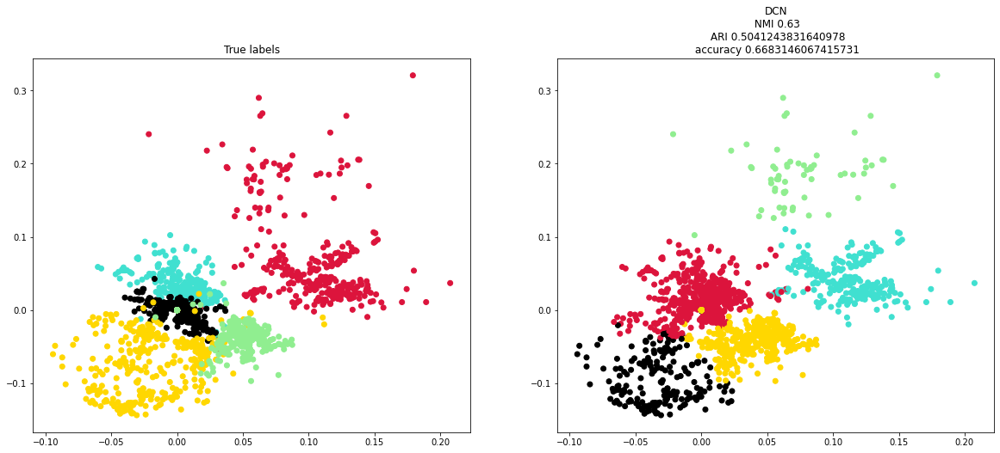

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dkm_pred_labels, labels_int),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 25.65it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:07<00:00,  2.66it/s]


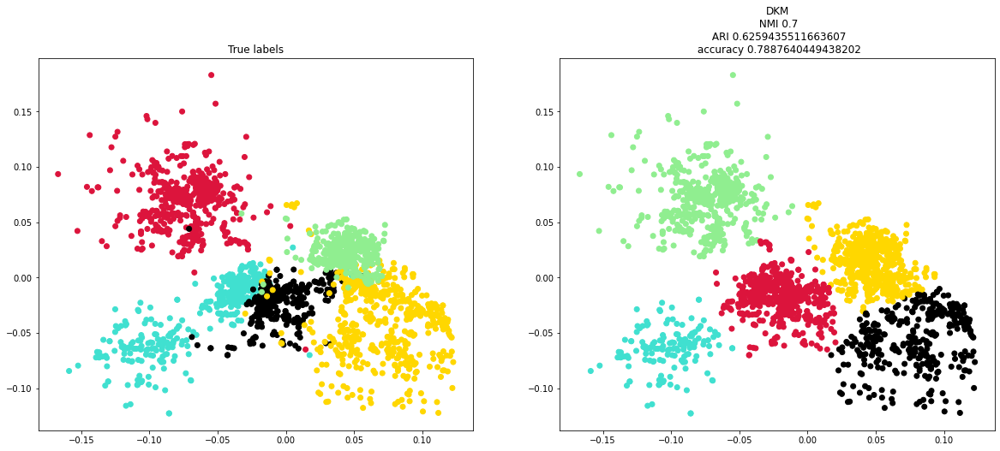

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

### Glove1

In [ ]:
X=X_glove

> #### RKM

In [ ]:
#rkm
rkm_model=fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=2, nstart=10)
rkm_pred_labels= rkm_model[0]
X_reduced_rkm=rkm_model[1][0]

rkm= {"labels": rkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(rkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(rkm_pred_labels, labels_int),
          "accuracy": accuracy(rkm_pred_labels, labels_int)}

  |======================================================================| 100%

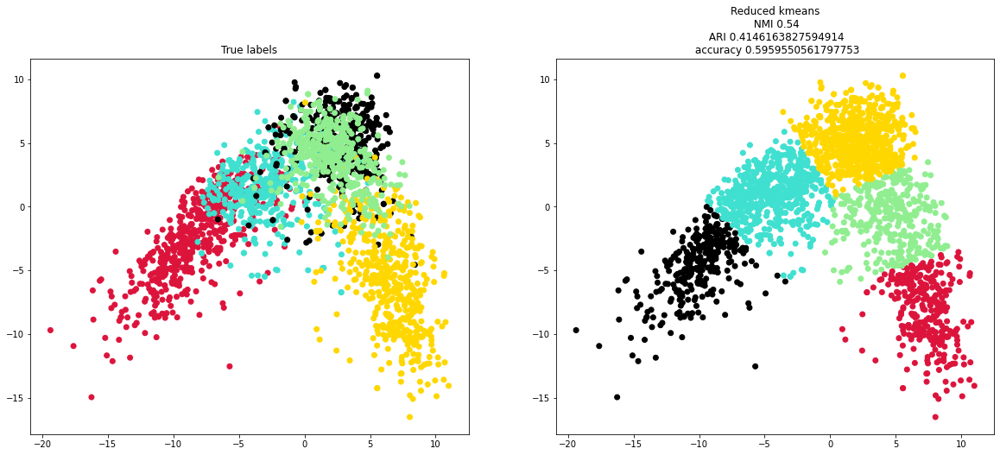

In [ ]:
eval_clustering_2(X_reduced_rkm, labels_int ,rkm, "True labels","Reduced kmeans")

> #### FKM

In [ ]:
#fkm
fkm_model=fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=2, nstart=10)
fkm_pred_labels= fkm_model[0]
X_reduced_fkm=fkm_model[1][0]

fkm= {"labels": fkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(fkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(fkm_pred_labels, labels_int),
          "accuracy": accuracy(fkm_pred_labels, labels_int)}

  |======================================================================| 100%

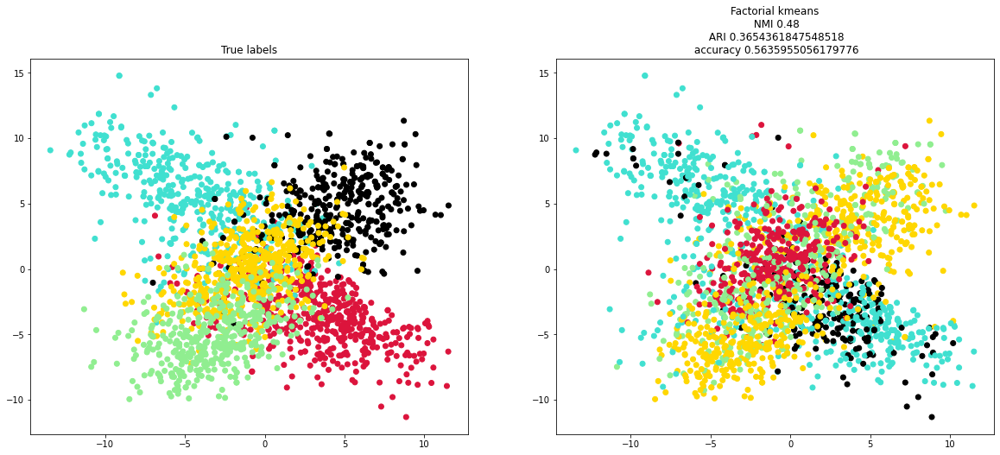

In [ ]:
eval_clustering_2(X_reduced_fkm, labels_int ,fkm, "True labels","Factorial kmeans")

> #### DCN

In [ ]:
tf.reset_default_graph()

In [ ]:
dcn_model =  DCN(data = X ,n_clusters =k ,n_components = 2)
dcn_pred_labels=dcn_model[1]
X_reduced_dcn=dcn_model[0]

dcn= {"labels": dcn_pred_labels,
          "NMI": round(normalized_mutual_info_score(dcn_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dcn_pred_labels, labels_int),
          "accuracy": accuracy(dcn_pred_labels, labels_int)}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 26.63it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:10<00:00,  4.66it/s]


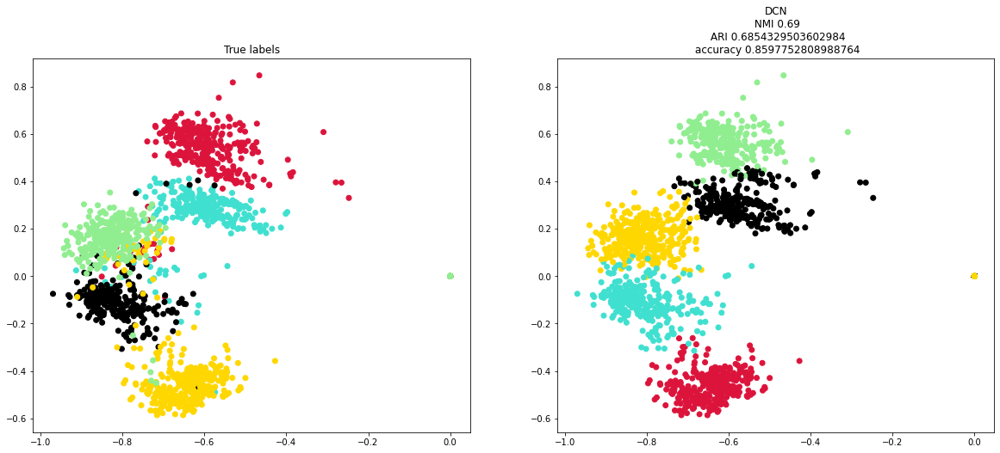

In [ ]:
eval_clustering_2(X_reduced_dcn, labels_int ,dcn, "True labels","DCN")

> #### DKM

In [ ]:
tf.reset_default_graph()

In [ ]:
#DKM
dkm_model = DKM(data = X , n_clusters = k , n_components = 2)

dkm_pred_labels=dkm_model[1]
X_reduced_dkm=dkm_model[0]

dkm= {"labels": dkm_pred_labels,
          "NMI": round(normalized_mutual_info_score(dkm_pred_labels, labels_int),2),
          "ARI": adjusted_rand_score(dkm_pred_labels, labels_int),
          "accuracy": accuracy(dkm_pred_labels, labels_int)}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 25.73it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:07<00:00,  2.56it/s]


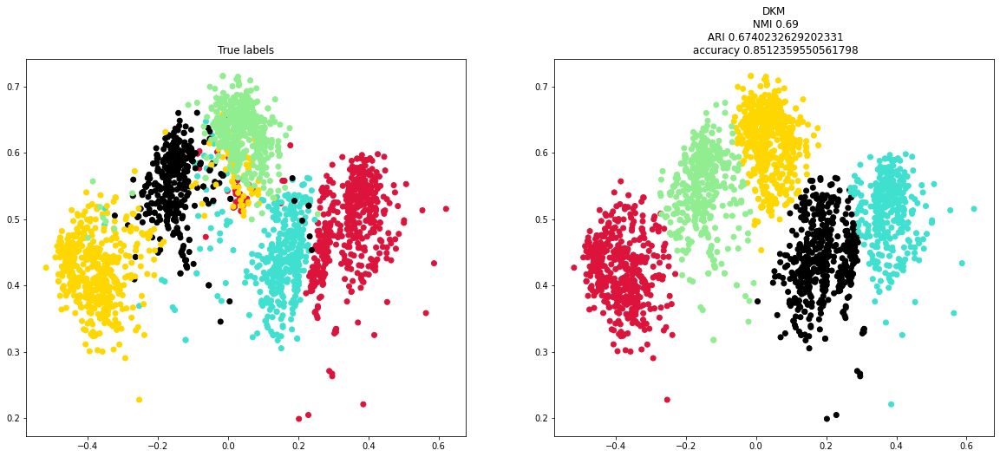

In [ ]:
eval_clustering_2(X_reduced_dkm, labels_int ,dkm, "True labels","DKM")

# Intérprétations des résultats

## Clustering sur les données d'origine



1.   Classic 4
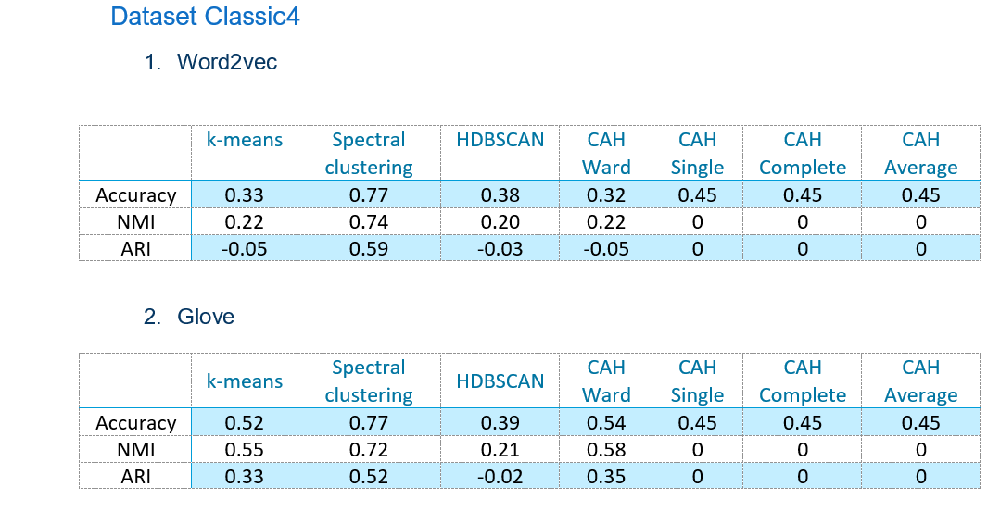

les performances des divers méthodes de clustering sont meilleurs de manière général en utilisant la représentation textuelle Glove car elle observe autant les statistiques local que les statistiques globales contrairement au word2vec qui ne n'intéresse qu'aux informations sur le contexte local des mots.

Dans les deux représentations, nous puvons observer que le clustering spectral donnent les meilleurs résultats cela est dû au fait qu'il fait un partitionnement sur un graphe de ce fait la proximité des classes ne l'empeche pas de bien les distinguer contrairement à k-means qui donnent de moins bien résultat étant donnée le shape arbitraires des classes et le déséquilibre en matière de taille des clusters. Les résultas du CAH sont aussi mauvai voir très mauvais car il est basé sur les distances et en vue de la grande dimension du dataset et de sa densité, la construction hiérarchique aboutit à de mauvaises classifications

2.   BBC
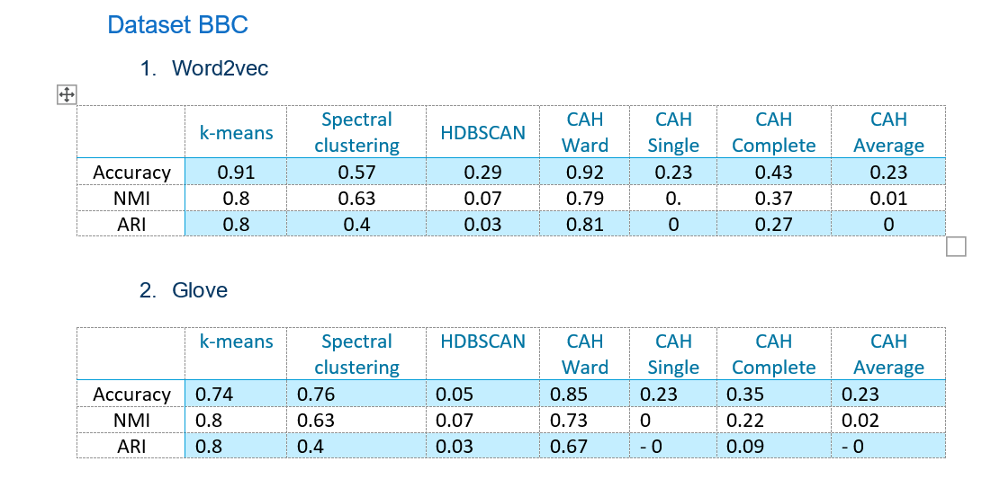


Nous pouvons remarqué que pour le dataset BBC les résultats de Word2vec sont meilleurs, cela est dû à la nature du dataset
A partir des graphes, il est évident que les classes ont la forme sphérique ce qui explique les très bon  résultats  de k-means et CAH Ward comparé au reste des méthodes. HDBSCAN étant une approche basé sur la densité, ses mauvais résulats mauvais sont dû à la proximité entre les classes rendut dificcile la detection des différentes zones denses.





## Clustering sur les données réduites : Tandem


1.   Classic 4
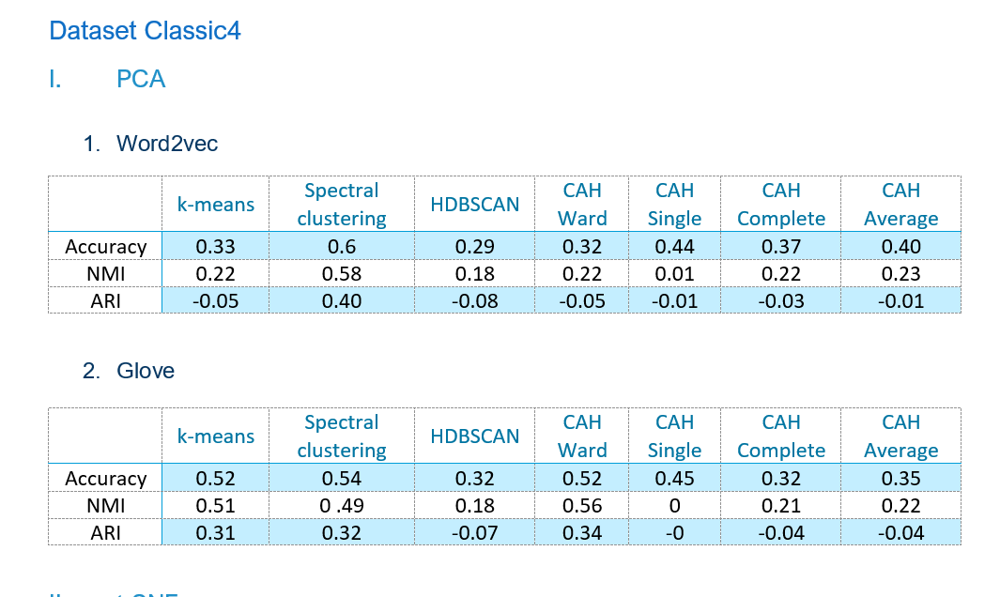

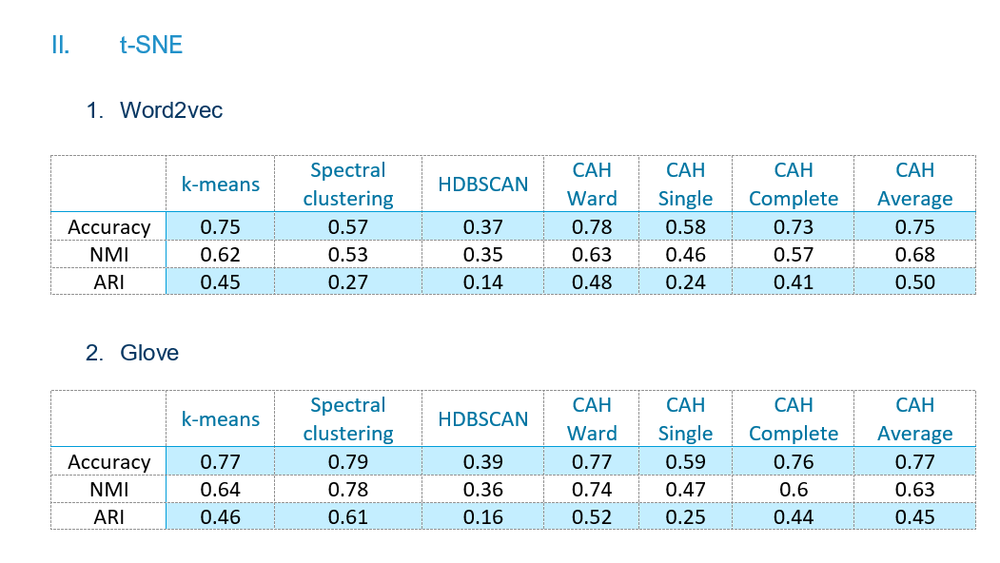

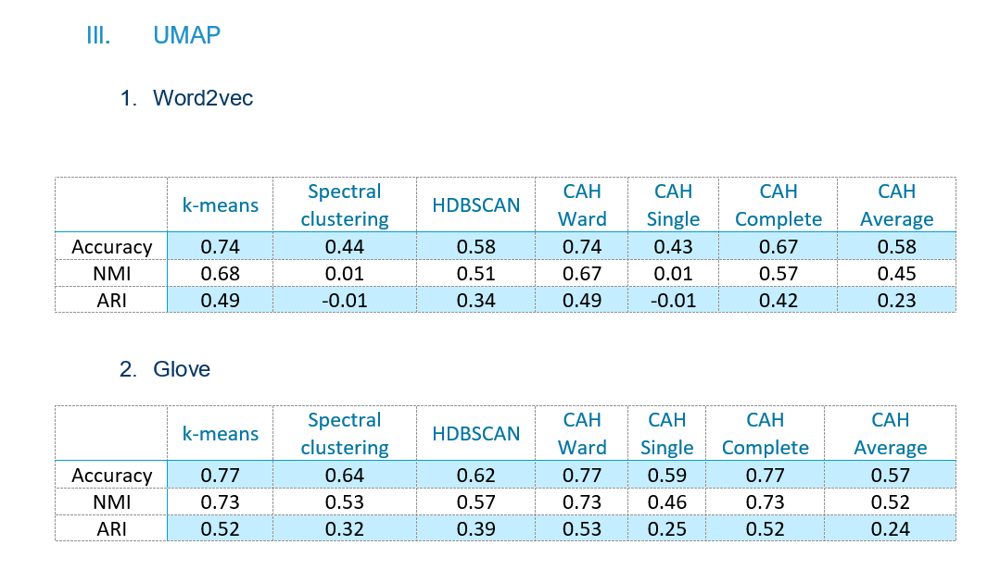

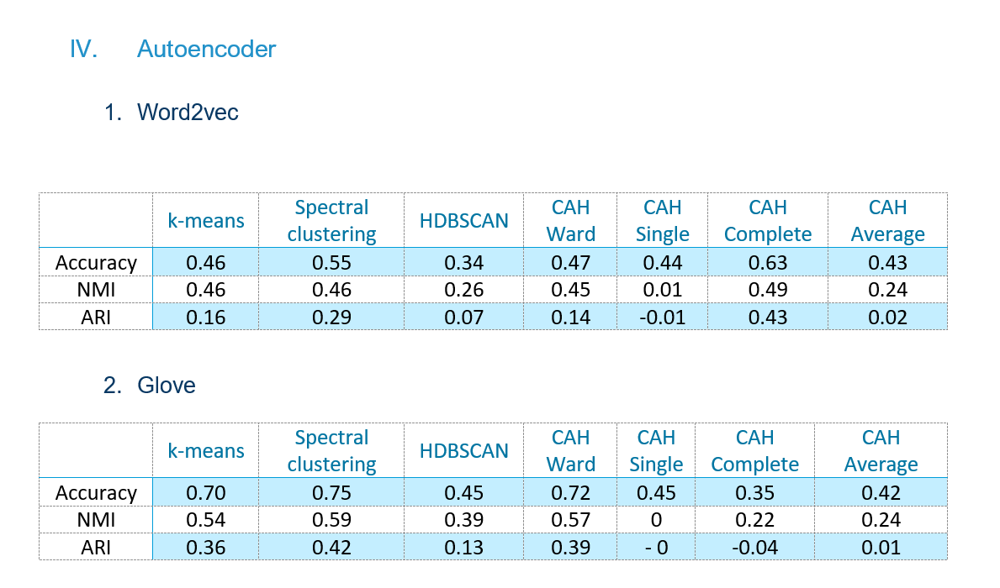

Comme observé lors du clustering sans réduction, on obtient de bons résultats en utilisant la représentation textuelle GloVe. Ceci est confirmé avec les résultats des méthodes tandem, en effet les meilleurs résultats selon les trois métriques utilisés sont obtenus avec Glove. La seule expection c'est lors de l'utilisation du PCA, ayant capturé que le dépendences linéaires entre les données, c'est avec word2vec qu'on a les meilleurs résultats( spectral clustering donnent les meilleurs résultats étant donné la forme arbitraire des classes obtenues après réduction). La meilleur approche pour ce dataset est t-SNE / Spectral clustering. Ceci est expliqué par le fait que t-SNE essaie de préserver la structure de voisinage ce qui permet de garder les instances similaires proches. Le spectral clustering ne fait aucune hypothèse sur la forme du cluster contrairement au k-means.

Nous pouvons aussi remarque que CAH donne des résultats assez bon lorsque la méthode de réduction utilisée sépare les classes ( les distancier) comme c'est le cas avec t-SNE. On peut aussi conclure que le critère d'agrégation qui donne dans la plupart des cas de bons résultats est celui de Ward.

2.   BBC
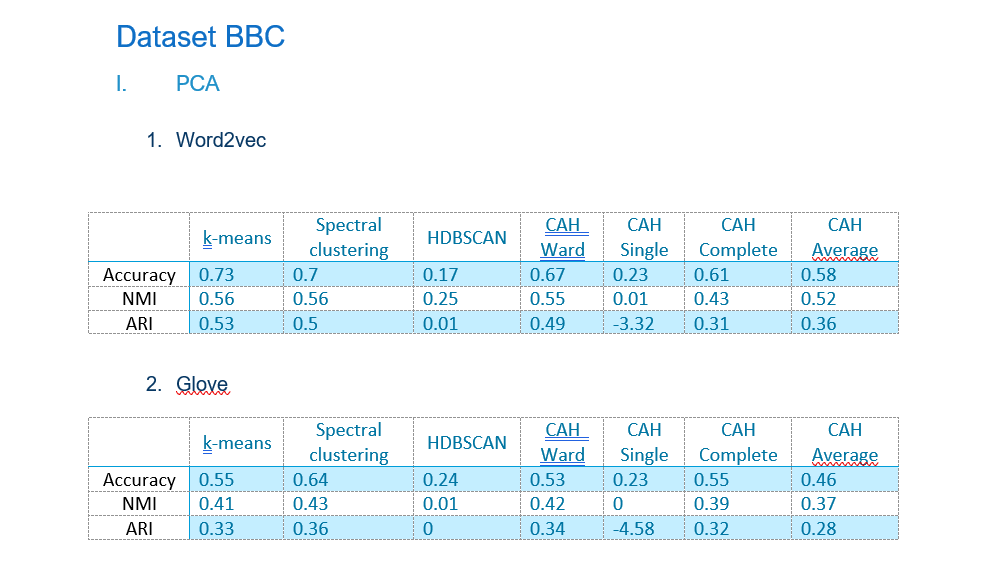

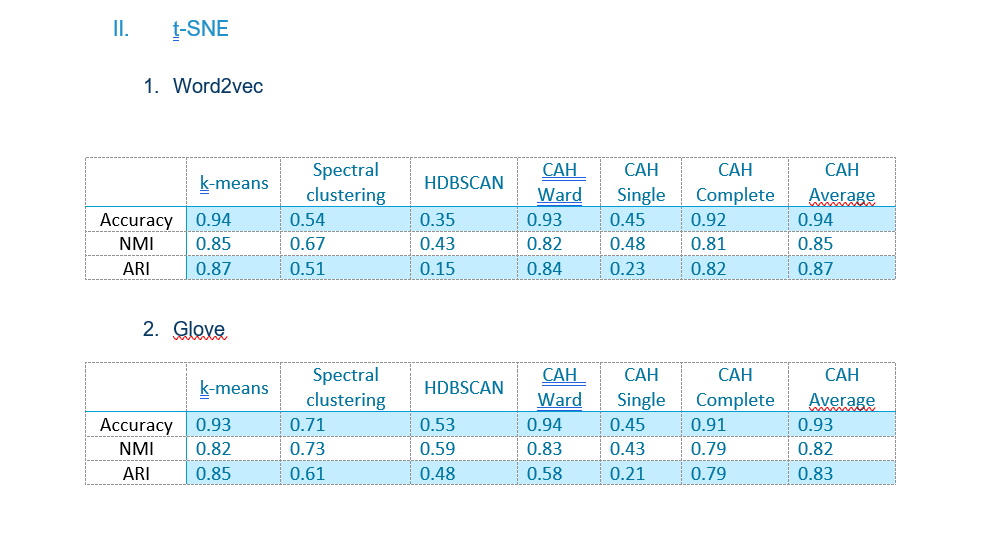

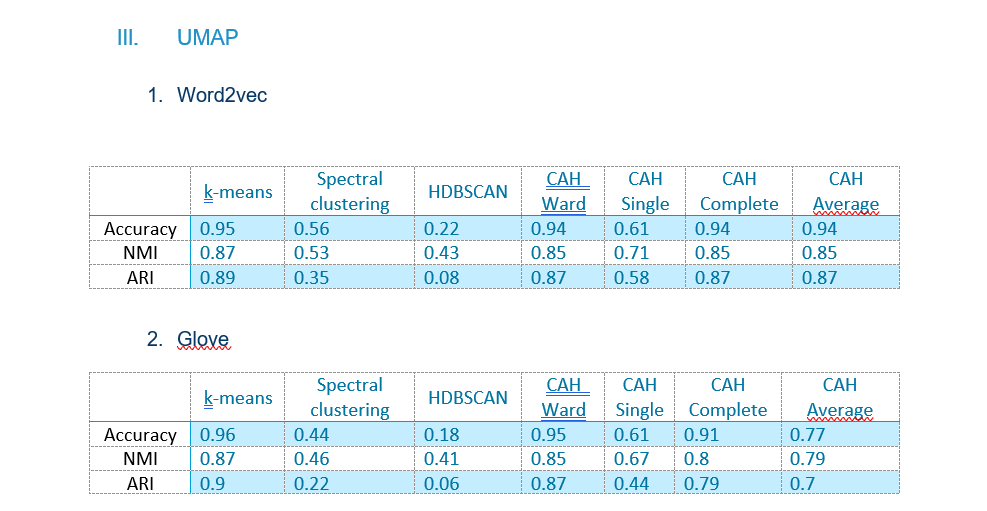

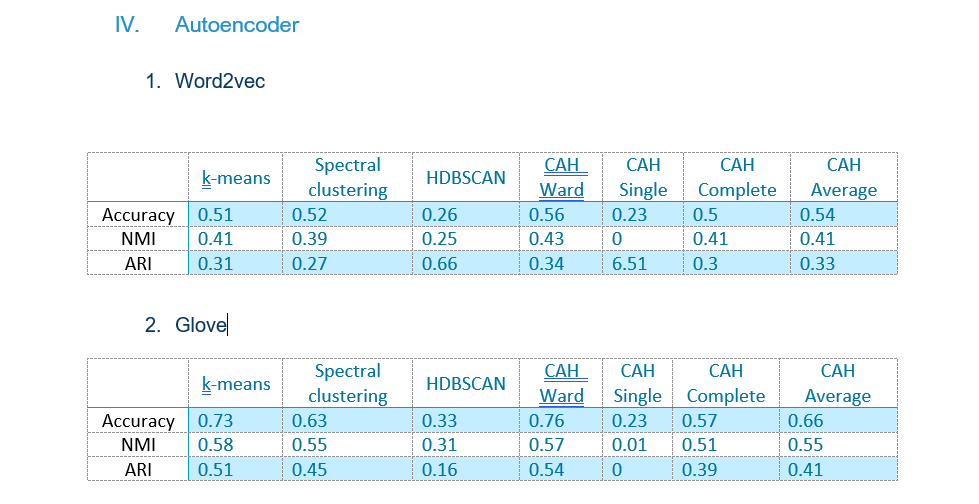


pour le dataset BBC, nous pouvons remarque que le choix de la méthode de réduction change les performances du clustering mais aussi  le choix de la meilleure représentation. En effet pour PCA et t-SNE le meilleurs perfomances sont obtenues avec la représentation word2vec et k-means comme méthode de clustering. Contrairement à UMAP et Autoencodeur qui nous donnenet les meilleurs résultats quand on utilise Glove comme représentation textuelle.

La meilleur méthode tandem pour le dataset BBC est UMAP/ k-means. k-means donnent les meilleurs résultats car les classes de BBC sont sphériques. Nous pouvons aussi remarquer que CAH avec complete ou ward nous donne de très bon résulats quand on utilise t-SNE ou UMAP pour la réduction de dimensions.


En conclusion suite à ces divers tests, nous pouvons conclure que HDBSCAN est une méthodes à éviter quand nous avons des datasets dont les classes sont très proches voir collés, comme c'est une approche basée sur la densité elle donnent de mauvais résultats. PCA et les autoencodeurs donnent des résulats moyennes. On peut atteindre de très bonne performances avec les méthodes de réduction t-SNE ou UMAP, dans la plupart des cas t-SNE présentent les meilleurs résultats associés au méthodes de clustering k-means, spectral clustering ou encore CAH ward. Cela dépend de la forme des clusters.

## En utilisant les méthodes Combinées ( Réduction de dimensionnalité et cluserting simultanément )

1.   Classic 4
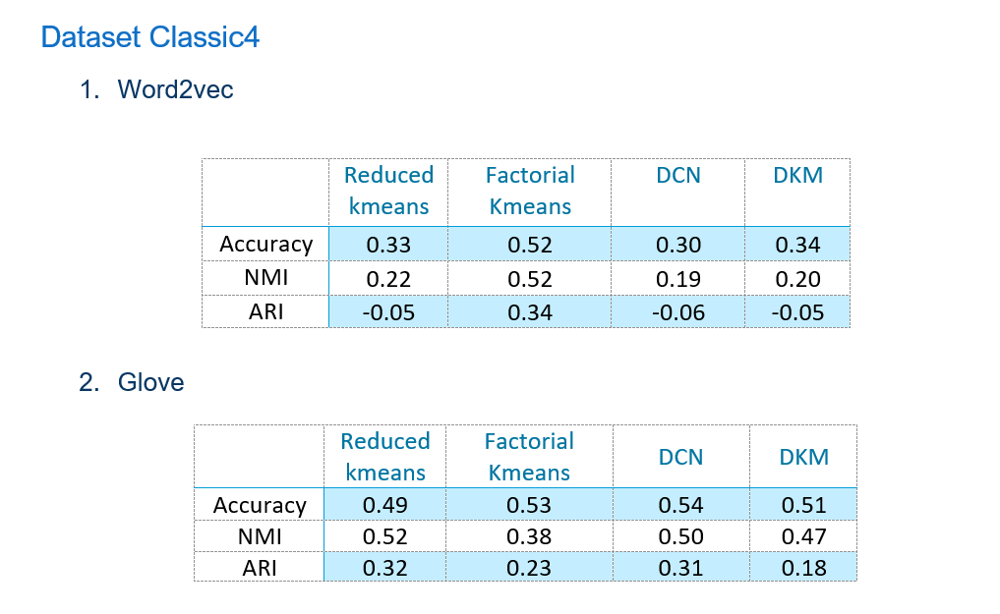

2.   BBC
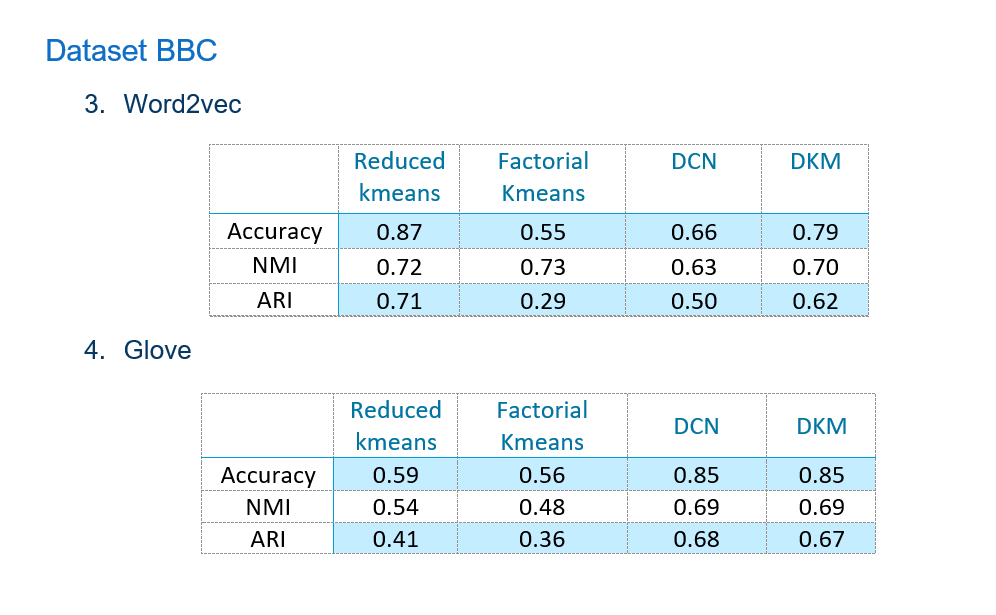


On observe que les approches combinées sont plus performantes dans le dataset BBC, notamment les méthodes deep (DCN et DKM) avec GloVe, ceci est dû d’une partie à la nature des classes (puisque les classes de BBC ont une forme sphérique ce qui explique les très bon résultats de DKM, ainsi que le nombre d'instances d’entrainement plus élevé) et d’une autre au fait que le modèle GloVe souligne que la fréquence des **co-occurrences** des mots est une information vitale et ne doit pas être "gaspillée" comme des exemples de formation supplémentaires. Au lieu de cela, GloVe construit des embeddings de mots de manière à ce qu'une combinaison de vecteurs de mots soit directement liée à la probabilité de co-occurrence de ces mots dans le corpus. Word2Vec apprend des embeddings en reliant les mots cibles à leur contexte. Cependant, il ne tient pas compte du fait que certains mots du contexte apparaissent plus souvent que d'autres. Pour Word2Vec, une co-occurrence fréquente de mots crée davantage d'exemples d'apprentissage, mais elle n'apporte aucune information supplémentaire. Dans notre cas, les classes du dataset BBC regroupe un corpus dont les mots ont une tendance à se répéter tout au long du corpus (à condition qu’ils soient sous la même classe). En revanche, pour le dataset Classic4 les document étant d’une nature scientifique, même avec un thème général ( Médecine , Mathématique …) , ne sont pas autant répétitif tout au long du dataset.


En ce qui concerne la performance des méthodes. Les méthodes combinées se sont avérées meilleures dans le jeu de données BBC, alors que les méthodes Tandem ont donné de meilleurs résultats dans le jeu de données classic4.